# Explanatory Data Analysis (EDA)

In [179]:
import pandas as pd


In [180]:
df = pd.read_csv('df_players.csv', sep=';')

In [181]:
print(df.dtypes)

Unnamed: 0                     int64
sofifa_id                      int64
short_name                    object
overall                        int64
potential                      int64
age                            int64
height_cm                      int64
weight_kg                      int64
club_name                     object
league_name                   object
club_contract_valid_until      int64
preferred_foot                object
pace                         float64
shooting                     float64
passing                      float64
dribbling                    float64
defending                    float64
physic                       float64
formation                     object
player_tags                   object
value_eur                     object
dtype: object


In [182]:
print(df.head())

   Unnamed: 0  sofifa_id   short_name  overall  potential  age  height_cm  \
0           1     255438     R. Araki       67         80   19        170   
1           2     246070   Iván Jaime       70         82   20        180   
2           3     203173      Noguera       68         68   31        177   
3           4     178090  D. Biseswar       75         75   33        176   
4           5     223978  Manu García       73         82   23        169   

   weight_kg                   club_name                    league_name  ...  \
0         60             Kashima Antlers  Japanese J. League Division 1  ...   
1         73  Futebol Clube de Famalicão     Portuguese Liga ZON SAGRES  ...   
2         65                      FC Goa            Indian Super League  ...   
3         79                        PAOK             Greek Super League  ...   
4         66            Deportivo Alavés         Spain Primera Division  ...   

   preferred_foot  pace  shooting  passing  dribbling  d

In [183]:
df = df.drop(columns=['Unnamed: 0'])
df['value_eur'] = df['value_eur'].str.replace(',', '.').astype(float)

In [184]:
print(df.head())

   sofifa_id   short_name  overall  potential  age  height_cm  weight_kg  \
0     255438     R. Araki       67         80   19        170         60   
1     246070   Iván Jaime       70         82   20        180         73   
2     203173      Noguera       68         68   31        177         65   
3     178090  D. Biseswar       75         75   33        176         79   
4     223978  Manu García       73         82   23        169         66   

                    club_name                    league_name  \
0             Kashima Antlers  Japanese J. League Division 1   
1  Futebol Clube de Famalicão     Portuguese Liga ZON SAGRES   
2                      FC Goa            Indian Super League   
3                        PAOK             Greek Super League   
4            Deportivo Alavés         Spain Primera Division   

   club_contract_valid_until preferred_foot  pace  shooting  passing  \
0                       2022          Right  83.0      61.0     61.0   
1             

In [185]:
print(df['value_eur'].dtype)

float64


In [186]:
# Assuming the base year for FIFA 22 is 2021
base_year = 2021

# Convert the existing column to represent years left on the contract
df['club_contract_valid_until'] = df['club_contract_valid_until'] - base_year

# Rename the column in-place to reflect its new meaning
df.rename(columns={'club_contract_valid_until': 'contract_years_left'}, inplace=True)

In [187]:
print(f'Rows: {len(df):,} | Columns: {df.shape[1]}')
print(f'Missing target values: {df["value_eur"].isna().sum()}')

missing = (df.isna().mean() * 100).sort_values(ascending=False)
display(missing[missing > 0].rename('missing_%').to_frame().round(1))

Rows: 5,969 | Columns: 20
Missing target values: 0


,missing_%
player_tags,88.1
dribbling,9.1
pace,9.1
physic,9.1
passing,9.1
defending,9.1
shooting,9.1


In [188]:
# Define the list of columns we want to check
cols_to_check = ['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']

# How many rows are missing a value in *at least one* of these columns?
missing_any = df[cols_to_check].isna().any(axis=1).sum()

# How many rows are missing values in *all* of these columns simultaneously?
missing_all = df[cols_to_check].isna().all(axis=1).sum()

print(f'Rows missing at least one stat: {missing_any}')
print(f'Rows missing all stats: {missing_all}')

Rows missing at least one stat: 543
Rows missing all stats: 543


In [189]:
missing_rows = df[df['pace'].isna()]
display(missing_rows.sample(10))

,sofifa_id,short_name,overall,potential,age,height_cm,weight_kg,club_name,league_name,contract_years_left,preferred_foot,pace,shooting,passing,dribbling,defending,physic,formation,player_tags,value_eur
1067,244020,André Ferreira,65,71,25,193,79,FC Paços de Ferreira,Portuguese Liga ZON SAGRES,3,Right,NaN,NaN,NaN,NaN,NaN,NaN,GK,NaN,875000.0
994,173857,M. Andújar,73,73,37,194,86,Estudiantes de La Plata,Argentina Primera División,1,Right,NaN,NaN,NaN,NaN,NaN,NaN,GK,NaN,350000.0
806,209990,R. Strebinger,72,74,28,194,90,SK Rapid Wien,Austrian Football Bundesliga,1,Right,NaN,NaN,NaN,NaN,NaN,NaN,GK,NaN,2000000.0
575,198355,S. Clark,72,72,35,188,86,Portland Timbers,USA Major League Soccer,0,Right,NaN,NaN,NaN,NaN,NaN,NaN,GK,NaN,250000.0
773,247561,Guo Wei,58,58,31,190,77,Shenzhen FC,Chinese Super League,1,Right,NaN,NaN,NaN,NaN,NaN,NaN,GK,NaN,110000.0
709,251818,L. Requena,68,68,33,186,80,Club de Deportes Cobresal,Chilian Campeonato Nacional,0,Left,NaN,NaN,NaN,NaN,NaN,NaN,GK,NaN,400000.0
667,204842,Y. Brecher,70,73,28,196,88,FC Zürich,Swiss Super League,2,Right,NaN,NaN,NaN,NaN,NaN,NaN,GK,NaN,1500000.0
950,202811,E. Martínez,84,85,28,195,88,Aston Villa,English Premier League,3,Right,NaN,NaN,NaN,NaN,NaN,NaN,GK,NaN,33500000.0
775,223709,A. Vural,69,69,30,187,68,Demir Grup Sivasspor,Turkish Süper Lig,3,Right,NaN,NaN,NaN,NaN,NaN,NaN,GK,NaN,925000.0
786,217646,S. Nishikawa,69,69,35,183,81,Urawa Red Diamonds,Japanese J. League Division 1,1,Left,NaN,NaN,NaN,NaN,NaN,NaN,GK,NaN,150000.0


The missing values appear to belong to goalkeepers. Let's verify:

In [190]:
missing_rows = df[df['pace'].isna()]

positions_distribution = missing_rows['formation'].value_counts()

print(positions_distribution)

formation
GK    543
Name: count, dtype: int64


The missing skill values are structural rather than random: all 543 affected players are goalkeepers, for whom these outfield attributes are not defined. Therefore, they should not be treated as ordinary missing observations.

In [13]:
#Report
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="FIFA Players EDA Report", correlations={
    "pearson": {"calculate": False},
    "spearman": {"calculate": True},
    "phi_k": {"calculate": True}
})

profile.to_notebook_iframe()

profile.to_file("my_eda_report.html")

C:\Users\User\AppData\Local\Temp\ipykernel_1848\3561097378.py:2: DeprecationWarning: 
    `import ydata_profiling` is deprecated and will not receive more updates. 
    Please install fg-data-profiling via `pip install fg-data-profiling` and use `import data_profiling` instead.
    
  from ydata_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 20/20 [00:00<00:00, 386.67it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [191]:
Q1 = df['value_eur'].quantile(0.25)
Q3 = df['value_eur'].quantile(0.75)
IQR = Q3 - Q1

upper_bound = Q3 + 1.5 * IQR

value_outliers = df[df['value_eur'] > upper_bound]

print(f'IQR upper bound: €{upper_bound / 1_000_000:.2f}M')
print(f'Players above the IQR bound: {len(value_outliers)}')
print(f'Share of dataset: {len(value_outliers) / len(df):.1%}')

IQR upper bound: €8.09M
Players above the IQR bound: 836
Share of dataset: 14.0%


In [192]:
top_value_players = (
    df.nlargest(10, 'value_eur')[
        [
            'short_name',
            'age',
            'overall',
            'potential',
            'club_name',
            'value_eur'
        ]
    ]
    .copy()
)

top_value_players['value_eur'] = (
    top_value_players['value_eur'] / 1_000_000
)

top_value_players = top_value_players.rename(
    columns={'value_eur': 'Value (€M)'}
)

display(top_value_players)

,short_name,age,overall,potential,club_name,Value (€M)
5693,K. Mbappé,22,91,95,Paris Saint-Germain,194.0
5256,E. Haaland,20,88,93,Borussia Dortmund,137.5
5848,H. Kane,27,90,90,Tottenham Hotspur,129.5
3168,Neymar Jr,29,91,91,Paris Saint-Germain,129.0
4391,K. De Bruyne,30,91,91,Manchester City,125.5
783,G. Donnarumma,22,89,93,Paris Saint-Germain,119.5
4389,F. de Jong,24,87,92,FC Barcelona,119.5
5931,R. Lewandowski,32,92,92,FC Bayern München,119.5
2654,J. Sancho,21,87,91,Manchester United,116.5
3746,T. Alexander-Arnold,22,87,92,Liverpool,114.0


Extreme market values were inspected. Although a standard IQR rule classifies many high-value players as outliers, the largest observations correspond to legitimate elite players such as Mbappé, Haaland, Kane and Neymar. These observations represent the real upper tail of the dataset rather than obvious data errors.

In [193]:
value_summary = pd.Series({
    'Players': len(df),
    'Median value (€)': df['value_eur'].median(),
    'Mean value (€)': df['value_eur'].mean(),
    '90th percentile / Top-10% threshold (€)': df['value_eur'].quantile(0.90),
    '99th percentile (€)': df['value_eur'].quantile(0.99),
    'Maximum value (€)': df['value_eur'].max(),
    'Share of total value held by top 10% (%)': (
    df.nlargest(int(0.10 * len(df)), 'value_eur')['value_eur'].sum() / df['value_eur'].sum()
) * 100
})
display(value_summary.to_frame('Value').style.format('{:,.0f}'))

,Value
Players,"5,969"
Median value (€),"1,600,000"
Mean value (€),"5,200,072"
90th percentile / Top-10% threshold (€),"13,000,000"
99th percentile (€),"59,780,000"
Maximum value (€),"194,000,000"
Share of total value held by top 10% (%),61


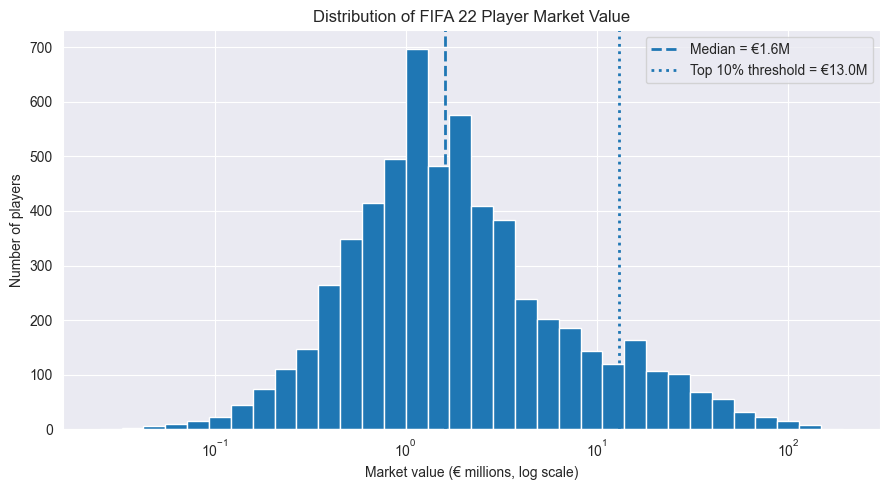

In [196]:
import numpy as np
from matplotlib import pyplot as plt

values_m = df['value_eur'] / 1_000_000
median_m = df['value_eur'].median() / 1_000_000
top10_threshold_m = df['value_eur'].quantile(0.90) / 1_000_000

fig, ax = plt.subplots(figsize=(9, 5))
bins = np.logspace(np.log10(values_m.min()), np.log10(values_m.max()), 35)
ax.hist(values_m, bins=bins, edgecolor='white')
ax.set_xscale('log')
ax.axvline(median_m, linestyle='--', linewidth=2, label=f'Median = €{median_m:.1f}M')
ax.axvline(top10_threshold_m, linestyle=':', linewidth=2, label=f'Top 10% threshold = €{top10_threshold_m:.1f}M')
ax.set_title('Distribution of FIFA 22 Player Market Value')
ax.set_xlabel('Market value (€ millions, log scale)')
ax.set_ylabel('Number of players')
ax.legend()
plt.tight_layout()
plt.show()

Interpretation: the median player is worth about €1.6M, while the top 10% starts at €13M. The top 10% of players account for roughly 61% of the total value in this sample.

In [197]:
# Define a function that takes players in the same formation and returns a summary for them
def calc_position_summary(group):
    total_value = group['value_eur'].sum()
    top_10_percent_count = int(0.10 * len(group))

    # Calculate the share of the top 10% (with a safeguard in case the total is 0 or the group is too small)
    if total_value > 0 and top_10_percent_count > 0:
        share_top_10 = (group.nlargest(top_10_percent_count, 'value_eur')['value_eur'].sum() / total_value) * 100
    else:
        share_top_10 = 0

    return pd.Series({
        'Players': len(group),
        'Median value (€)': group['value_eur'].median(),
        'Mean value (€)': group['value_eur'].mean(),
        '90th percentile threshold (€)': group['value_eur'].quantile(0.90),
        '99th percentile (€)': group['value_eur'].quantile(0.99),
        'Maximum value (€)': group['value_eur'].max(),
        'Share of total value held by top 10% (%)': share_top_10
    })

# Group by formation and apply the summary function
summary_by_position = df.groupby('formation').apply(calc_position_summary)

# Sort the resulting table by the number of players in each formation (descending)
summary_by_position = summary_by_position.sort_values(by='Players', ascending=False)

# Display the result formatted with commas and no decimal places
display(summary_by_position.style.format('{:,.0f}'))

C:\Users\User\AppData\Local\Temp\ipykernel_1848\1867752910.py:23: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  summary_by_position = df.groupby('formation').apply(calc_position_summary)


,Players,Median value (€),Mean value (€),90th percentile threshold (€),99th percentile (€),Maximum value (€),Share of total value held by top 10% (%)
formation,,,,,,,
def,"2,187","1,300,000","4,113,402","9,500,000","47,070,000","114,000,000",60
mid,"2,154","1,800,000","5,680,232","15,000,000","60,055,000","125,500,000",59
att,"1,085","1,900,000","6,698,134","16,500,000","77,580,000","194,000,000",62
GK,543,"1,100,000","4,678,683","12,000,000","69,400,000","119,500,000",65


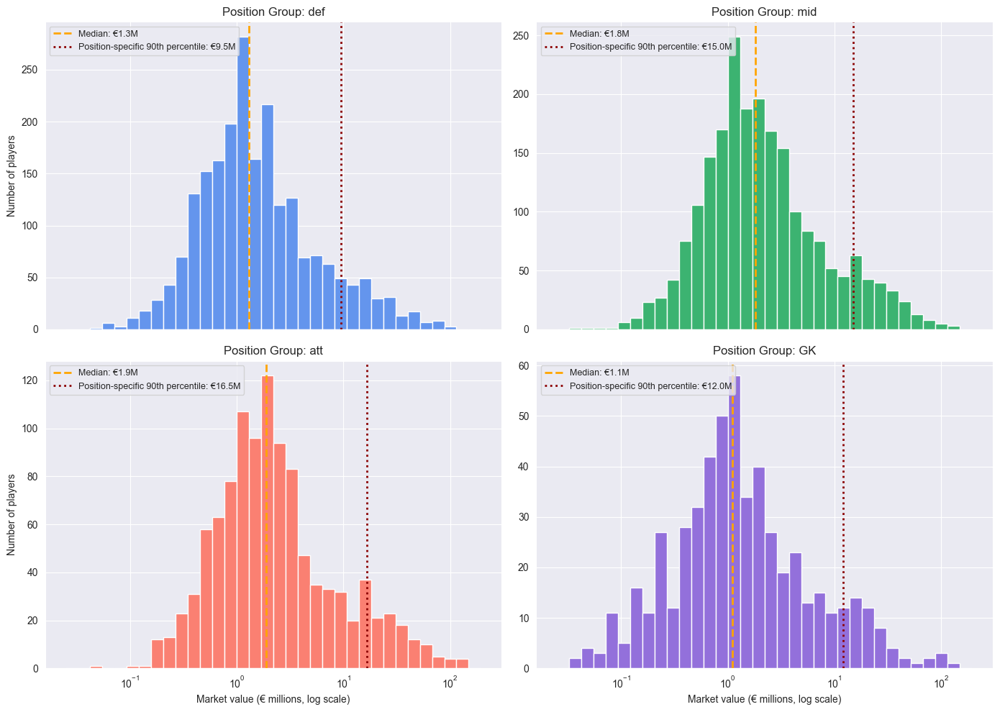

In [199]:
import numpy as np
from matplotlib import pyplot as plt

# 1. Get the top 4 most common formations to fit exactly in a 2x2 grid
top_formations = df['formation'].value_counts().head(4).index.tolist()

# Define 4 distinct colors for the graphs
plot_colors = ['cornflowerblue', 'mediumseagreen', 'salmon', 'mediumpurple']

# 2. Filter out zero values to avoid errors with the log scale
df_filtered = df[df['value_eur'] > 0]

# 3. Create global bins so all subplots share the exact same X-axis scale
global_min_m = df_filtered['value_eur'].min() / 1_000_000
global_max_m = df_filtered['value_eur'].max() / 1_000_000
global_bins = np.logspace(np.log10(global_min_m), np.log10(global_max_m), 35)

# 4. Create a 2x2 grid of subplots (4 cells total)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10), sharex=True)
axes = axes.flatten()

# 5. Loop through each formation, its subplot, and its assigned color
for i, (formation, color) in enumerate(zip(top_formations, plot_colors)):
    ax = axes[i]

    # Filter data for the current formation
    df_form = df_filtered[df_filtered['formation'] == formation]

    # Calculate values in millions
    values_m = df_form['value_eur'] / 1_000_000
    median_m = values_m.median()
    top10_threshold_m = values_m.quantile(0.90)

    # Plot the histogram using the global bins and the specific color
    ax.hist(values_m, bins=global_bins, edgecolor='white', color=color)
    ax.set_xscale('log')

    # Add the vertical lines
    ax.axvline(median_m, color='orange', linestyle='--', linewidth=2,
               label=f'Median: €{median_m:.1f}M')
    # Switched top 10% line to dark red so it stands out against the new colors
    ax.axvline(top10_threshold_m, color='darkred', linestyle=':', linewidth=2,
               label=f'Position-specific 90th percentile: €{top10_threshold_m:.1f}M')

    # Design tweaks for each subplot
    ax.set_title(f'Position Group: {formation}')
    ax.legend(fontsize=9, loc='upper left')

    # Only show X labels on the bottom row (indices 2 and 3)
    if i >= 2:
        ax.set_xlabel('Market value (€ millions, log scale)')

    # Only show Y labels on the leftmost column (indices 0 and 2)
    if i % 2 == 0:
        ax.set_ylabel('Number of players')

plt.tight_layout()
plt.show()

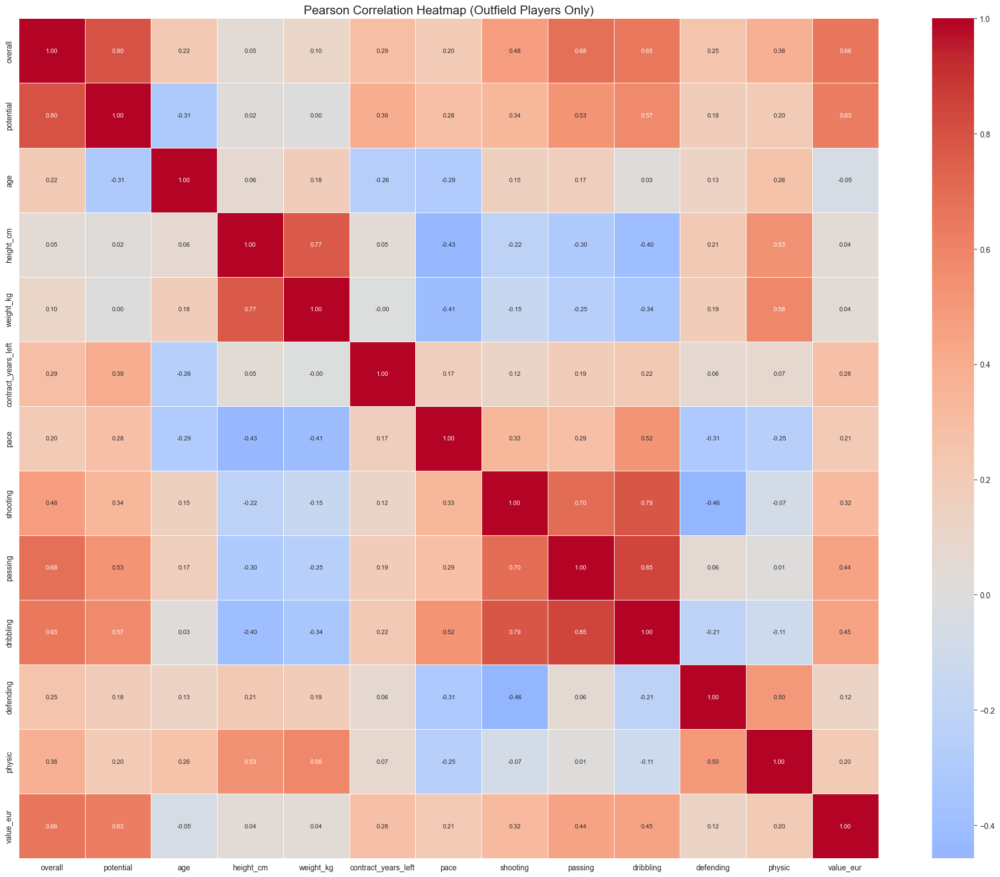

In [200]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Remove Goalkeepers to prevent distortion
df_no_GK = df[df['formation'] != 'GK']

# 2. Select ONLY numeric columns
numeric_df = (
    df_no_GK
    .select_dtypes(include=['float64', 'int64'])
    .drop(columns=['sofifa_id'])
)

# 3. Calculate the correlation matrix
corr_matrix = numeric_df.corr()

# 4. Create the heatmap plot
# Increased the figure size to give the numbers more room to breathe
plt.figure(figsize=(20, 16))

# Plot the heatmap with annotations
sns.heatmap(corr_matrix,
            annot=True,
            fmt='.2f',
            cmap='coolwarm',
            center=0,
            linewidths=0.5,
            annot_kws={"size": 8})

plt.title('Pearson Correlation Heatmap (Outfield Players Only)', fontsize=16)
plt.tight_layout()
plt.show()

In [201]:
numeric_for_corr = [
    'overall', 'potential', 'age', 'contract_years_left',
    'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic',
    'height_cm', 'weight_kg', 'value_eur'
]

spearman = (
    df[numeric_for_corr]
    .corr(method='spearman')['value_eur']
    .drop('value_eur')
    .sort_values(key=lambda s: s.abs(), ascending=False)
)

display(spearman.rename('Spearman correlation with value_eur').to_frame().round(3))

,Spearman correlation with value_eur
potential,0.910
overall,0.883
dribbling,0.678
passing,0.611
shooting,0.456
contract_years_left,0.396
pace,0.328
physic,0.272
defending,0.253
age,-0.177


In [202]:
for formation, group in df.groupby('formation'):
    print(f"\n--- Formation: {formation} ---")

    spearman = (
        group[numeric_for_corr]
        .corr(method='spearman')['value_eur']
        .drop('value_eur')
        .sort_values(key=lambda s: s.abs(), ascending=False)
    )

    display(spearman.rename('Spearman correlation with value_eur').to_frame().round(3))


--- Formation: GK ---


,Spearman correlation with value_eur
potential,0.897
overall,0.775
contract_years_left,0.447
age,-0.331
height_cm,0.181
weight_kg,0.044
pace,NaN
shooting,NaN
passing,NaN
dribbling,NaN



--- Formation: att ---


,Spearman correlation with value_eur
overall,0.914
potential,0.910
dribbling,0.817
shooting,0.746
passing,0.658
contract_years_left,0.375
pace,0.351
physic,0.286
defending,0.249
age,-0.096



--- Formation: def ---


,Spearman correlation with value_eur
potential,0.925
overall,0.883
defending,0.763
dribbling,0.541
passing,0.514
contract_years_left,0.408
physic,0.405
pace,0.311
shooting,0.303
age,-0.216



--- Formation: mid ---


,Spearman correlation with value_eur
overall,0.912
potential,0.912
dribbling,0.824
passing,0.753
shooting,0.644
contract_years_left,0.377
pace,0.281
defending,0.273
physic,0.254
age,-0.126


Both current quality (overall) and future ceiling (potential) have very strong monotonic relationships with market value. While overall and potential are consistently the strongest value indicators across positions, the importance of individual technical skills varies by role. Shooting is particularly informative for attackers, defending for defenders, and passing/dribbling for midfielders.

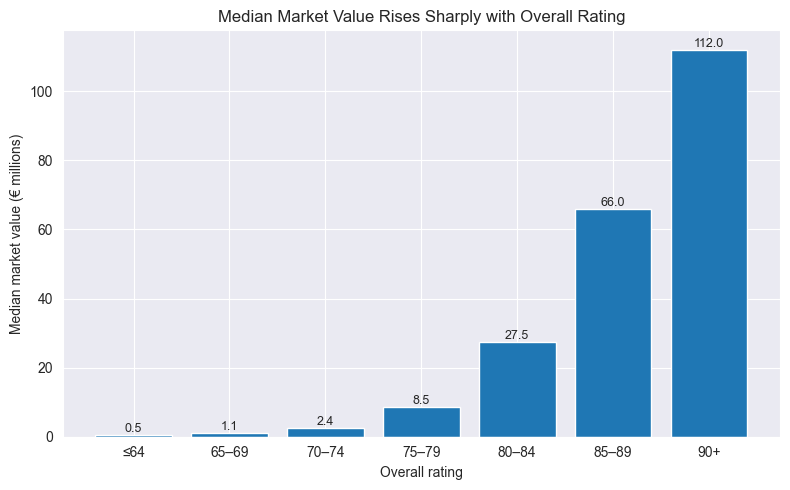

In [203]:
overall_bins = pd.cut(
    df['overall'],
    bins=[0, 64, 69, 74, 79, 84, 89, 100],
    labels=['≤64', '65–69', '70–74', '75–79', '80–84', '85–89', '90+']
)
overall_value = df.groupby(overall_bins, observed=True)['value_eur'].median() / 1_000_000

fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(overall_value.index.astype(str), overall_value.values)
ax.set_title('Median Market Value Rises Sharply with Overall Rating')
ax.set_xlabel('Overall rating')
ax.set_ylabel('Median market value (€ millions)')
for i, v in enumerate(overall_value.values):
    ax.text(i, v, f'{v:.1f}', ha='center', va='bottom', fontsize=9)
plt.tight_layout()
plt.show()

Median market value rises increasingly sharply across higher Overall-rating tiers. The increase is especially pronounced as players move into the elite rating ranges.

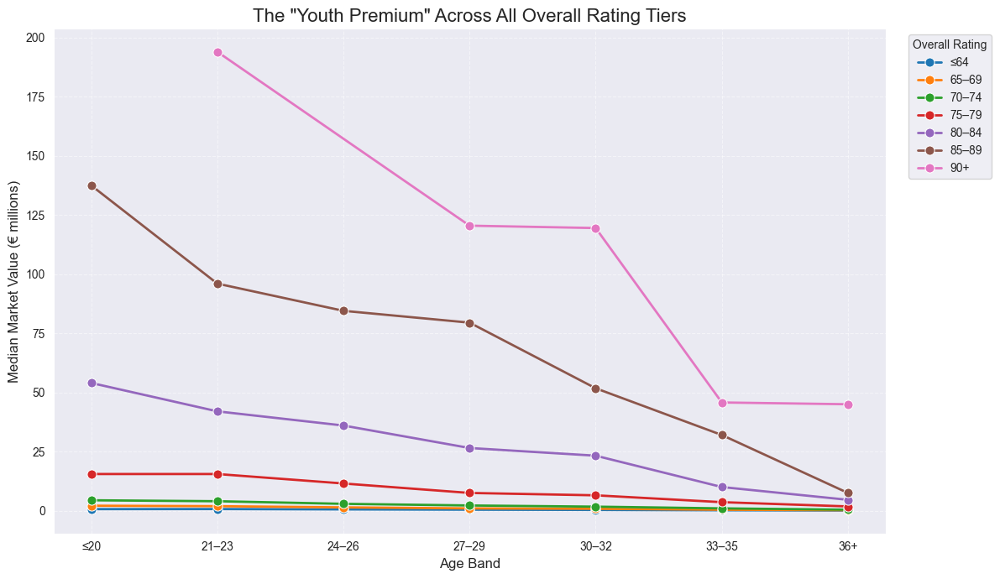

In [204]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Create the Overall bands for the ENTIRE dataset
df['overall_band'] = pd.cut(
    df['overall'],
    bins=[0, 64, 69, 74, 79, 84, 89, 100],
    labels=['≤64', '65–69', '70–74', '75–79', '80–84', '85–89', '90+']
)

# 2. Create the Age bands for the ENTIRE dataset
df['age_band'] = pd.cut(
    df['age'],
    bins=[0, 20, 23, 26, 29, 32, 35, 100],
    labels=['≤20', '21–23', '24–26', '27–29', '30–32', '33–35', '36+']
)

# 3. Calculate median value for EACH combination of Age and Overall
grouped_data = df.groupby(['age_band', 'overall_band'], observed=True)['value_eur'].median() / 1_000_000
plot_data = grouped_data.reset_index()

# 4. Create the plot
plt.figure(figsize=(12, 7))

# Use a line plot with a highly distinct color palette ('tab10')
sns.lineplot(
    data=plot_data,
    x='age_band',
    y='value_eur',
    hue='overall_band',
    marker='o',
    linewidth=2,
    markersize=8,
    palette='tab10'  # <-- Changed to a distinct categorical palette
)

# 5. Design and labels
plt.title('The "Youth Premium" Across All Overall Rating Tiers', fontsize=16)
plt.xlabel('Age Band', fontsize=12)
plt.ylabel('Median Market Value (€ millions)', fontsize=12)

# Move the legend outside the plot
plt.legend(title='Overall Rating', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

The youth premium is visible across nearly all overall-rating tiers. Within a similar level of current ability, median market value generally decreases as players get older. For example, among players rated 70–74, median value falls from approximately €4.4M for players aged 20 or younger to €0.43M for players aged 36+, while among players rated 80–84 it falls from €54M to €4.6M. The absolute financial impact of age is therefore much larger for highly rated players. The 90+ group contains very few players, so results for that tier should be interpreted cautiously.

The table below shows the number of players behind each point in the figure. Very small groups, especially in the 90+ tier, should be interpreted cautiously.


In [205]:

count_table = (
    df.groupby(
        ['age_band', 'overall_band'],
        observed=True
    )
    .size()
    .unstack(fill_value=0)
)

display(count_table)

overall_band,≤64,65–69,70–74,75–79,80–84,85–89,90+
age_band,,,,,,,
≤20,180,109,40,24,3,1,0
21–23,321,354,233,128,35,6,1
24–26,272,429,400,208,63,12,0
27–29,220,492,426,227,88,26,4
30–32,137,362,318,155,52,20,3
33–35,53,134,134,98,44,11,2
36+,19,44,41,33,5,1,1


The same relationship is shown on a logarithmic scale below, making it easier to compare proportional changes in value across Overall-rating tiers with very different absolute market values.

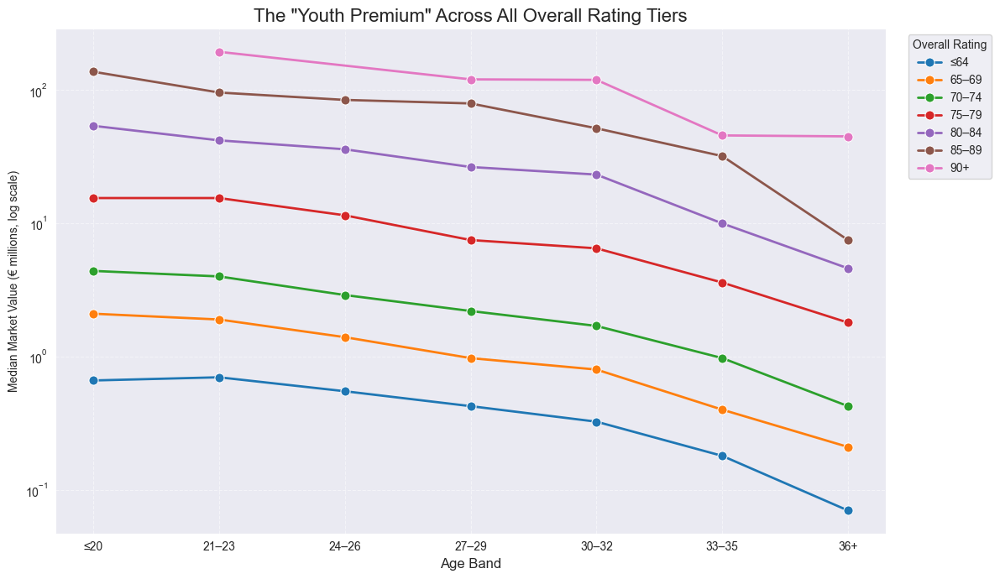

In [206]:
# Calculate median value for EACH combination of Age and Overall
grouped_data = df.groupby(['age_band', 'overall_band'], observed=True)['value_eur'].median() / 1_000_000
plot_data = grouped_data.reset_index()

# Create the plot
plt.figure(figsize=(12, 7))

# Use a line plot with a highly distinct color palette ('tab10')
sns.lineplot(
    data=plot_data,
    x='age_band',
    y='value_eur',
    hue='overall_band',
    marker='o',
    linewidth=2,
    markersize=8,
    palette='tab10'  # <-- Changed to a distinct categorical palette
)

# 5. Design and labels
plt.title('The "Youth Premium" Across All Overall Rating Tiers', fontsize=16)
plt.xlabel('Age Band', fontsize=12)
plt.yscale('log')
plt.ylabel('Median Market Value (€ millions, log scale)')

# Move the legend outside the plot
plt.legend(title='Overall Rating', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

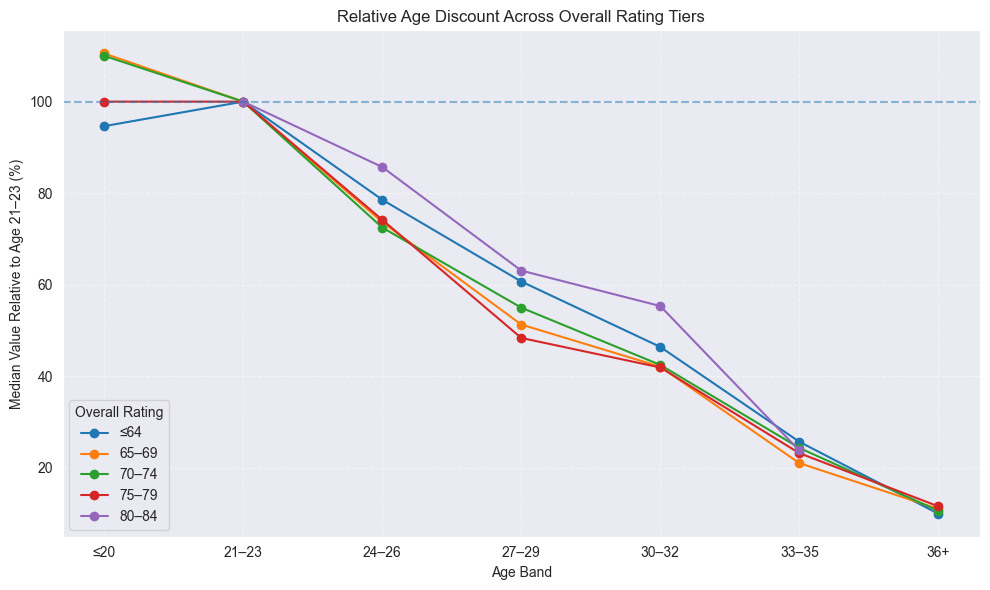

In [207]:
median_table = (
    df.groupby(
        ['overall_band', 'age_band'],
        observed=True
    )['value_eur']
    .median()
    .unstack()
)

count_table_relative = (
    df.groupby(
        ['overall_band', 'age_band'],
        observed=True
    )
    .size()
    .unstack(fill_value=0)
)

relative_value = (
    median_table
    .div(median_table['21–23'], axis=0)
    * 100
)

# Hide points based on fewer than 10 players
relative_value_reliable = relative_value.where(
    count_table_relative >= 10
)

tiers_to_plot = ['≤64', '65–69', '70–74', '75–79', '80–84']

relative_value_reliable.loc[tiers_to_plot].T.plot(
    marker='o',
    figsize=(10, 6)
)

plt.axhline(100, linestyle='--', alpha=0.5)

plt.xlabel('Age Band')
plt.ylabel('Median Value Relative to Age 21–23 (%)')
plt.title('Relative Age Discount Across Overall Rating Tiers')

plt.legend(title='Overall Rating')
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

The relative age discount follows a remarkably similar pattern across the main Overall rating tiers. After age 21–23, median market value declines at a similar relative rate across different ability levels. For the rating tiers with sufficient observations at age 36+, median value falls to approximately 10–12% of the value observed for 21–23-year-old players within the same Overall tier. This pattern is consistent with an approximately proportional rather than fixed-euro age discount. Points based on fewer than 10 players are hidden, while the 85–89 and 90+ tiers are omitted because several age bands contain too few observations for a reliable comparison.

In [208]:
# Clean the player_tags column

clean_tags = (
    df['player_tags']
    .fillna('')
    .str.replace('\xa0', ' ', regex=False)   # remove non-breaking spaces
    .str.replace('#', '', regex=False)       # remove # symbol
    .apply(
        lambda s: ', '.join(
            tag.strip()
            for tag in s.split(',')
            if tag.strip()
        )
    )
)

# Convert every tag into a binary column (0/1)
tags_dummies = clean_tags.str.get_dummies(sep=', ')

# Add the tag columns to the dataframe
# Using assignment rather than concat makes the cell safe to run again
for col in tags_dummies.columns:
    df[col] = tags_dummies[col]

tag_columns = list(tags_dummies.columns)

print(f'Number of unique tags: {len(tag_columns)}')
print(tag_columns)

Number of unique tags: 17
['Acrobat', 'Aerial Threat', 'Clinical Finisher', 'Complete Defender', 'Complete Forward', 'Complete Midfielder', 'Crosser', 'Distance Shooter', 'Dribbler', 'Engine', 'FK Specialist', 'Playmaker', 'Poacher', 'Speedster', 'Strength', 'Tackling', 'Tactician']


In [209]:
tag_frequency = (
    tags_dummies.sum()
    .sort_values(ascending=False)
    .reset_index()
)

tag_frequency.columns = ['Tag', 'Number of Players']

tag_frequency['Percentage of Players'] = (
    tag_frequency['Number of Players'] / len(df) * 100
)

tag_frequency

,Tag,Number of Players,Percentage of Players
0,Strength,250,4.188306
1,Acrobat,167,2.797789
2,Engine,135,2.261685
3,Speedster,113,1.893114
4,Dribbler,60,1.005193
5,Aerial Threat,44,0.737142
6,Tactician,25,0.418831
7,Clinical Finisher,22,0.368571
8,Playmaker,21,0.351818
9,Crosser,20,0.335064


In [210]:
tag_impact_results = []

for tag in tag_columns:

    players_with_tag = df[df[tag] == 1]
    players_without_tag = df[df[tag] == 0]

    count_with = len(players_with_tag)

    median_with = players_with_tag['value_eur'].median()
    median_without = players_without_tag['value_eur'].median()

    multiplier = median_with / median_without

    tag_impact_results.append({
        'Tag': tag,
        'Players with Tag': count_with,
        'Presence (%)': count_with / len(df) * 100,
        'Median Value WITH (€M)': median_with / 1_000_000,
        'Median Value WITHOUT (€M)': median_without / 1_000_000,
        'Value Multiplier': multiplier
    })

tag_impact = pd.DataFrame(tag_impact_results)

tag_impact = tag_impact.sort_values(
    'Median Value WITH (€M)',
    ascending=False
)

tag_impact.round(2)

,Tag,Players with Tag,Presence (%),Median Value WITH (€M),Median Value WITHOUT (€M),Value Multiplier
5,Complete Midfielder,13,0.22,79.50,1.60,49.69
7,Distance Shooter,16,0.27,76.50,1.60,47.81
4,Complete Forward,16,0.27,71.25,1.60,44.53
2,Clinical Finisher,22,0.37,65.25,1.60,40.78
3,Complete Defender,4,0.07,65.00,1.60,40.62
15,Tackling,19,0.32,55.50,1.60,34.69
11,Playmaker,21,0.35,53.50,1.60,33.44
8,Dribbler,60,1.01,45.00,1.60,28.12
6,Crosser,20,0.34,42.75,1.60,26.72
16,Tactician,25,0.42,42.50,1.60,26.56


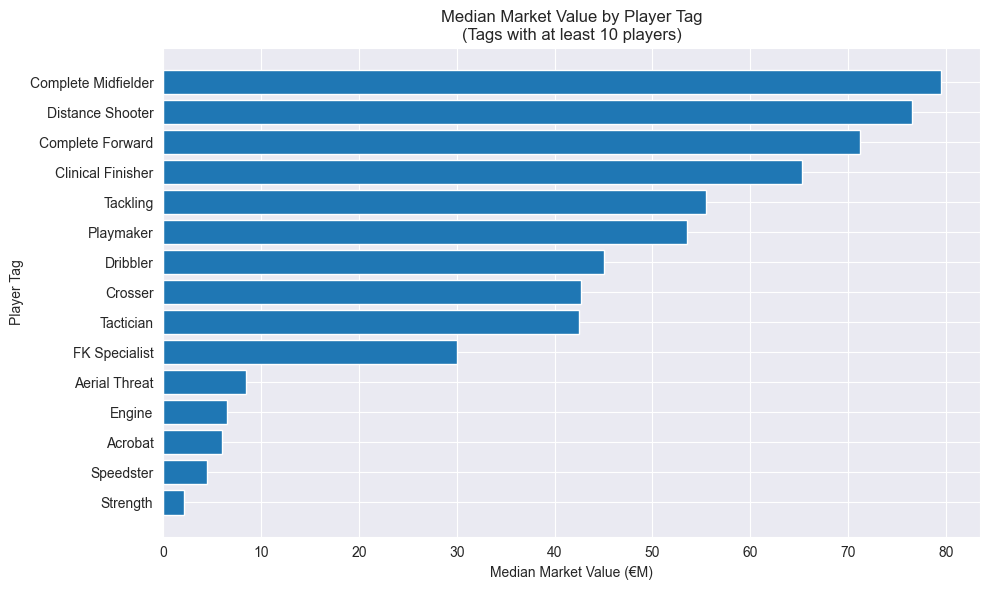

In [211]:
tag_impact_plot = (
    tag_impact[tag_impact['Players with Tag'] >= 10]
    .sort_values('Median Value WITH (€M)', ascending=True)
)

plt.figure(figsize=(10, 6))

plt.barh(
    tag_impact_plot['Tag'],
    tag_impact_plot['Median Value WITH (€M)']
)

plt.xlabel('Median Market Value (€M)')
plt.ylabel('Player Tag')
plt.title('Median Market Value by Player Tag\n(Tags with at least 10 players)')

plt.tight_layout()
plt.show()

In [212]:
df['has_tag'] = (tags_dummies.sum(axis=1) > 0).astype(int)

tag_presence_summary = (
    df.groupby('has_tag')
    .agg(
        Players=('value_eur', 'size'),
        Median_Value=('value_eur', 'median'),
        Median_Overall=('overall', 'median'),
        Median_Potential=('potential', 'median')
    )
    .reset_index()
)

tag_presence_summary['Group'] = tag_presence_summary['has_tag'].map({
    0: 'No Tag',
    1: 'At Least One Tag'
})

tag_presence_summary['Median Value (€M)'] = (
    tag_presence_summary['Median_Value'] / 1_000_000
)

tag_presence_summary[
    [
        'Group',
        'Players',
        'Median Value (€M)',
        'Median_Overall',
        'Median_Potential'
    ]
].round(2)

,Group,Players,Median Value (€M),Median_Overall,Median_Potential
0,No Tag,5259,1.40,69.0,72.0
1,At Least One Tag,710,4.95,75.0,77.0


In [213]:
df['number_of_tags'] = tags_dummies.sum(axis=1)

tag_count_summary = (
    df.groupby('number_of_tags')
    .agg(
        Players=('value_eur', 'size'),
        Median_Value=('value_eur', 'median')
    )
    .reset_index()
)

tag_count_summary['Median Value (€M)'] = (
    tag_count_summary['Median_Value'] / 1_000_000
)

tag_count_summary[
    ['number_of_tags', 'Players', 'Median Value (€M)']
].round(2)

,number_of_tags,Players,Median Value (€M)
0,0,5259,1.40
1,1,560,3.60
2,2,104,10.50
3,3,22,30.25
4,4,12,69.75
5,5,6,97.00
6,6,5,107.50
7,7,1,45.00


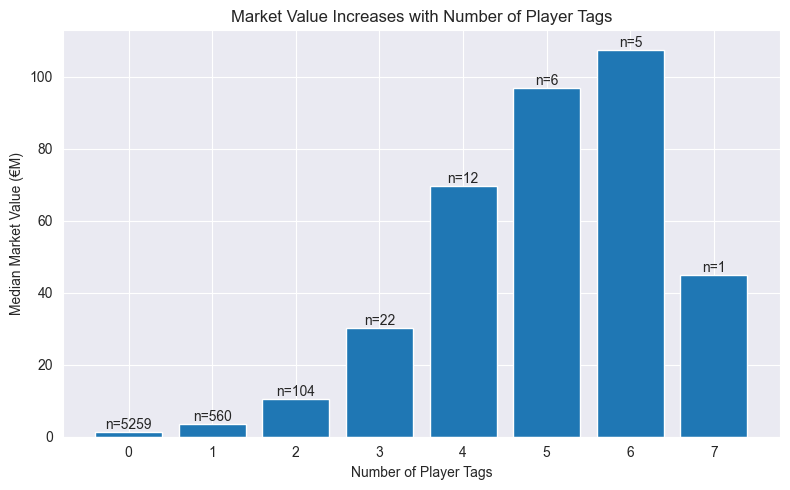

In [214]:
plt.figure(figsize=(8, 5))

bars = plt.bar(
    tag_count_summary['number_of_tags'],
    tag_count_summary['Median Value (€M)']
)

plt.xlabel('Number of Player Tags')
plt.ylabel('Median Market Value (€M)')
plt.title('Market Value Increases with Number of Player Tags')

# Add number of players above each bar
for bar, count in zip(bars, tag_count_summary['Players']):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f'n={count}',
        ha='center',
        va='bottom'
    )

plt.tight_layout()
plt.show()

Player tags are strongly associated with market value. Players with at least one tag have a substantially higher median value and higher Overall and Potential ratings than untagged players, while median value also tends to increase with the number of tags. However, the groups with many tags contain very few players, so the largest values should be interpreted cautiously.

In [215]:
tag_by_overall = (
    df.groupby(
        ['overall_band', 'has_tag'],
        observed=True
    )
    .agg(
        Players=('value_eur', 'size'),
        Median_Value=('value_eur', 'median')
    )
    .reset_index()
)

tag_by_overall['Median Value (€M)'] = (
    tag_by_overall['Median_Value'] / 1_000_000
)

display(
    tag_by_overall[
        ['overall_band', 'has_tag', 'Players', 'Median Value (€M)']
    ].round(2)
)

,overall_band,has_tag,Players,Median Value (€M)
0,≤64,0,1175,0.50
1,≤64,1,27,0.50
2,65–69,0,1790,1.10
3,65–69,1,134,1.20
4,70–74,0,1412,2.40
5,70–74,1,180,2.50
6,75–79,0,690,8.50
7,75–79,1,183,10.50
8,80–84,0,170,25.00
9,80–84,1,120,30.75


Much of the overall difference between tagged and untagged players appears to be explained by differences in Overall rating. Within the lower Overall-rating bands, tagged and untagged players have very similar median values, while a larger difference remains among higher-rated players. This suggests that tags primarily identify stronger players, although among higher-rated players they may capture additional information not reflected by Overall rating alone. The highest Overall bands contain relatively few players and should therefore be interpreted cautiously.

In [36]:
##############leagues

In [37]:
top10_threshold = df['value_eur'].quantile(0.90)

df['is_top10'] = (
    df['value_eur'] >= top10_threshold
).astype(int)

league_summary = (
    df.groupby('league_name')
    .agg(
        Players=('value_eur', 'size'),
        Median_Value=('value_eur', 'median'),
        Median_Overall=('overall', 'median'),
        Median_Potential=('potential', 'median'),
        Median_Age=('age', 'median'),
        Top10_Rate=('is_top10', 'mean')
    )
    .reset_index()
)

league_summary['Median Value (€M)'] = (
    league_summary['Median_Value'] / 1_000_000
)

league_summary['Top 10 (%)'] = (
    league_summary['Top10_Rate'] * 100
)

league_summary = league_summary.sort_values(
    'Median Value (€M)',
    ascending=False
)

display(
    league_summary[
        [
            'league_name',
            'Players',
            'Median Value (€M)',
            'Median_Overall',
            'Median_Potential',
            'Median_Age',
            'Top 10 (%)'
        ]
    ].round(2)
)

,league_name,Players,Median Value (€M),Median_Overall,Median_Potential,Median_Age,Top 10 (%)
13,English Premier League,220,15.50,78.0,82.0,27.0,56.36
37,Spain Primera Division,220,14.25,78.0,80.0,28.0,51.82
16,German 1. Bundesliga,198,8.50,76.0,79.0,26.0,39.39
21,Italian Serie A,220,7.50,76.0,79.0,26.0,37.73
15,French Ligue 1,220,6.50,75.0,79.0,25.0,30.00
33,Russian Premier League,33,6.50,75.0,79.0,24.0,18.18
43,Ukrainian Premier League,22,5.25,74.5,79.5,23.5,31.82
10,Czech Republic Gambrinus Liga,33,4.00,74.0,77.0,26.0,9.09
4,Campeonato Brasileiro Série A,198,3.50,74.0,74.0,25.0,12.63
17,Greek Super League,44,3.15,74.0,75.0,29.0,4.55


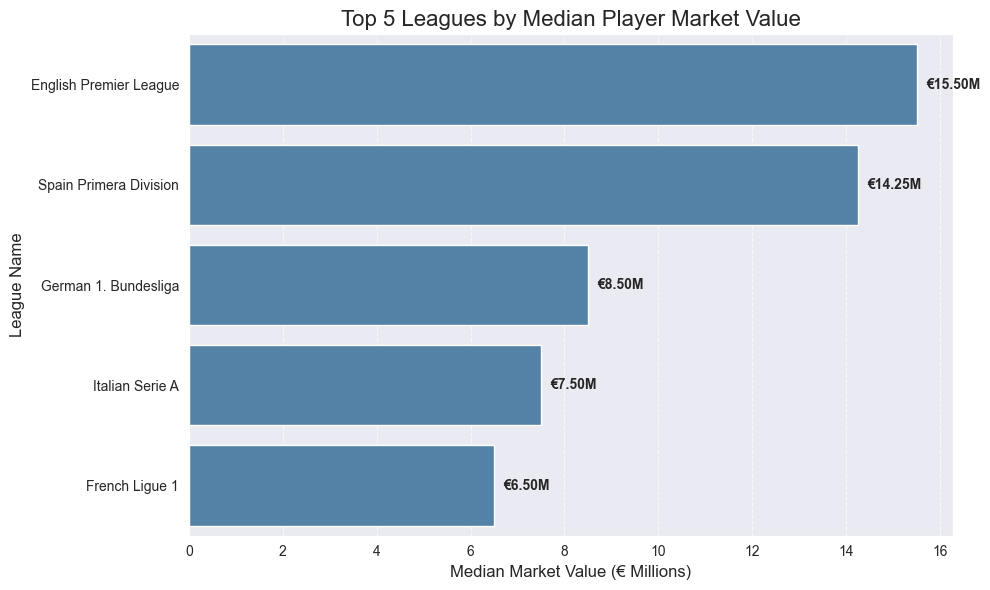

In [216]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Extract the top 5 leagues from the already sorted summary table
top5_leagues = league_summary.head(5)

# 2. Create the figure
plt.figure(figsize=(10, 6))

# 3. Create a horizontal bar plot with a single color
ax = sns.barplot(
    data=top5_leagues,
    x='Median Value (€M)',
    y='league_name',
    color='steelblue'  # <-- Changed from palette='viridis' to a single solid color
)

# 4. Design and labels
plt.title('Top 5 Leagues by Median Player Market Value', fontsize=16)
plt.xlabel('Median Market Value (€ Millions)', fontsize=12)
plt.ylabel('League Name', fontsize=12)

# 5. Add value annotations to the end of each bar
for i, v in enumerate(top5_leagues['Median Value (€M)']):
    ax.text(v + 0.2, i, f'€{v:.2f}M', va='center', fontsize=10, fontweight='bold')

# 6. Add a subtle grid on the x-axis for easier reading
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Adjust layout to prevent cutting off labels
plt.tight_layout()
plt.show()

In [217]:
big5_leagues = [
    'English Premier League',
    'Spain Primera Division',
    'German 1. Bundesliga',
    'Italian Serie A',
    'French Ligue 1'
]

df['is_big5'] = df['league_name'].isin(big5_leagues)

big5_summary = (
    df.groupby('is_big5')
    .agg(
        Players=('value_eur', 'size'),
        Median_Value=('value_eur', 'median'),
        Median_Overall=('overall', 'median'),
        Median_Potential=('potential', 'median'),
        Median_Age=('age', 'median'),
        Top10_Rate=('is_top10', 'mean')
    )
)

big5_summary['Median Value (€M)'] = (
    big5_summary['Median_Value'] / 1_000_000
)

big5_summary['Top 10 (%)'] = (
    big5_summary['Top10_Rate'] * 100
)

display(big5_summary.round(2))

KeyError: "Column(s) ['is_top10'] do not exist"

Players in the Big Five leagues have substantially higher market values, but they also have considerably higher Overall and Potential ratings. Therefore, the raw value difference should not be interpreted as a league effect by itself.

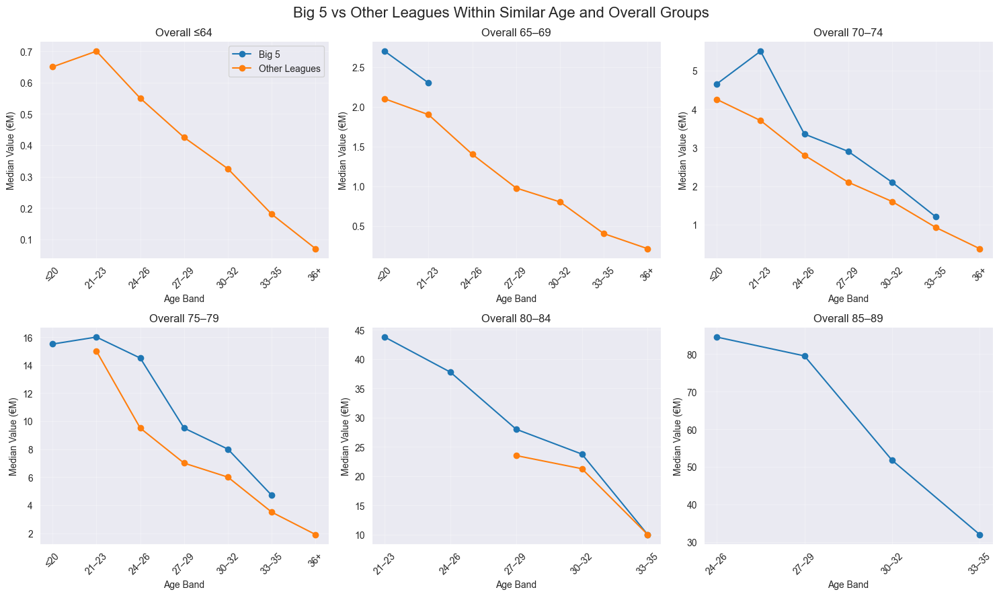

In [218]:
big5_controlled = (
    df.groupby(
        ['overall_band', 'age_band', 'is_big5'],
        observed=True
    )
    .agg(
        Players=('value_eur', 'size'),
        Median_Value=('value_eur', 'median')
    )
    .reset_index()
)

big5_controlled['Median Value (€M)'] = (
    big5_controlled['Median_Value'] / 1_000_000
)

big5_controlled['League Group'] = big5_controlled['is_big5'].map({
    True: 'Big 5',
    False: 'Other Leagues'
})

import matplotlib.pyplot as plt

overall_groups = [
    '≤64',
    '65–69',
    '70–74',
    '75–79',
    '80–84',
    '85–89'
]

fig, axes = plt.subplots(
    2, 3,
    figsize=(15, 9)
)

axes = axes.flatten()

for ax, overall_group in zip(axes, overall_groups):

    subset = big5_controlled[
        big5_controlled['overall_band'] == overall_group
    ]

    for league_group in ['Big 5', 'Other Leagues']:

        group = subset[
            subset['League Group'] == league_group
        ].copy()

        # Do not show unreliable points
        group = group[group['Players'] >= 10]

        ax.plot(
            group['age_band'],
            group['Median Value (€M)'],
            marker='o',
            label=league_group
        )

    ax.set_title(f'Overall {overall_group}')
    ax.set_xlabel('Age Band')
    ax.set_ylabel('Median Value (€M)')
    ax.grid(alpha=0.3)
    ax.tick_params(axis='x', rotation=45)

axes[0].legend()

plt.suptitle(
    'Big 5 vs Other Leagues Within Similar Age and Overall Groups',
    fontsize=16
)

plt.tight_layout()
plt.show()

C:\Users\User\AppData\Local\Temp\ipykernel_1848\324640855.py:3: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(


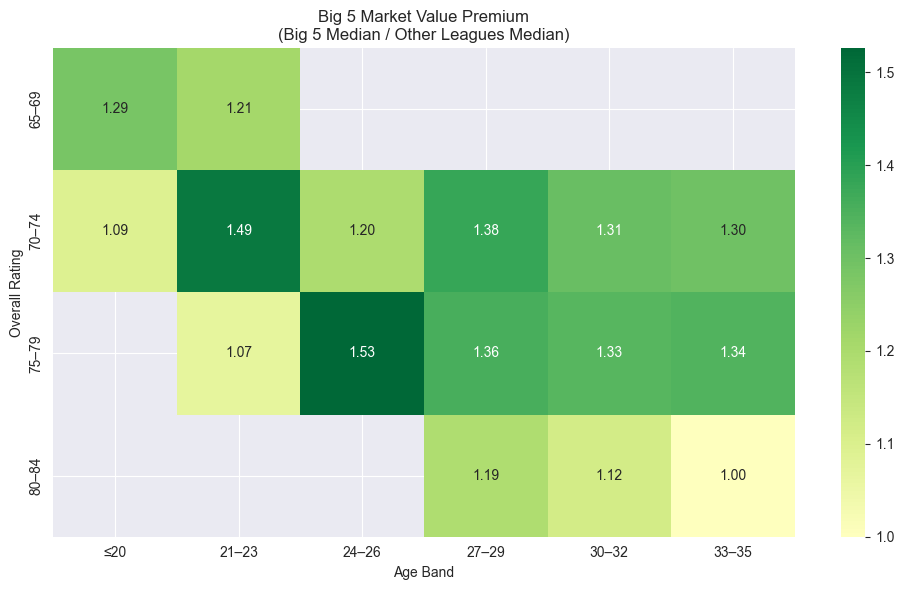

In [219]:
comparison = (
    big5_controlled
    .pivot_table(
        index=['overall_band', 'age_band'],
        columns='League Group',
        values=['Median Value (€M)', 'Players']
    )
)

comparison['Premium Ratio'] = (
    comparison[('Median Value (€M)', 'Big 5')]
    /
    comparison[('Median Value (€M)', 'Other Leagues')]
)

comparison['Reliable'] = (
    (comparison[('Players', 'Big 5')] >= 10)
    &
    (comparison[('Players', 'Other Leagues')] >= 10)
)

premium_data = (
    comparison.loc[comparison['Reliable'], 'Premium Ratio']
    .reset_index()
)

premium_heatmap = premium_data.pivot(
    index='overall_band',
    columns='age_band',
    values='Premium Ratio'
)

plt.figure(figsize=(10, 6))

sns.heatmap(
    premium_heatmap,
    annot=True,
    fmt='.2f',
    cmap='RdYlGn',
    center=1
)

plt.xlabel('Age Band')
plt.ylabel('Overall Rating')
plt.title('Big 5 Market Value Premium\n(Big 5 Median / Other Leagues Median)')

plt.tight_layout()
plt.show()

Big 5 Premium After Controlling for Age, Overall, and Potential

In [220]:
# Create Potential rating bands
df['potential_band'] = pd.cut(
    df['potential'],
    bins=[0, 69, 74, 79, 84, 89, 100],
    labels=['≤69', '70–74', '75–79', '80–84', '85–89', '90+'],
    include_lowest=True
)

# Compare Big 5 and Other Leagues within the same:
# Overall band + Age band + Potential band
big5_potential_controlled = (
    df.groupby(
        ['overall_band', 'age_band', 'potential_band', 'is_big5'],
        observed=True
    )
    .agg(
        Players=('value_eur', 'size'),
        Median_Value=('value_eur', 'median')
    )
    .reset_index()
)

big5_potential_controlled['League Group'] = (
    big5_potential_controlled['is_big5'].map({
        True: 'Big 5',
        False: 'Other Leagues'
    })
)

comparison_potential = (
    big5_potential_controlled
    .pivot_table(
        index=['overall_band', 'age_band', 'potential_band'],
        columns='League Group',
        values=['Median_Value', 'Players']
    )
)

# Keep only comparisons with at least 10 players in BOTH groups
reliable = (
    (comparison_potential[('Players', 'Big 5')] >= 10)
    &
    (comparison_potential[('Players', 'Other Leagues')] >= 10)
)

comparison_potential = comparison_potential.loc[reliable].copy()

# Big 5 premium ratio
comparison_potential['Premium Ratio'] = (
    comparison_potential[('Median_Value', 'Big 5')]
    /
    comparison_potential[('Median_Value', 'Other Leagues')]
)

premium_after_potential = (
    comparison_potential['Premium Ratio']
    .reset_index()
)

display(premium_after_potential.round(2))

print(
    'Number of reliable comparable groups:',
    len(premium_after_potential)
)

print(
    'Median Big 5 premium ratio:',
    round(premium_after_potential['Premium Ratio'].median(), 2)
)

C:\Users\User\AppData\Local\Temp\ipykernel_1848\1440595324.py:32: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(


,overall_band,age_band,potential_band,Premium Ratio
0,65–69,≤20,80–84,1.31
1,65–69,21–23,75–79,1.04
2,70–74,≤20,80–84,1.10
3,70–74,21–23,75–79,1.01
4,70–74,21–23,80–84,1.33
5,70–74,24–26,70–74,1.13
6,70–74,24–26,75–79,1.16
7,70–74,27–29,70–74,1.40
8,70–74,27–29,75–79,1.11
9,70–74,30–32,70–74,1.31


Number of reliable comparable groups: 21
Median Big 5 premium ratio: 1.16


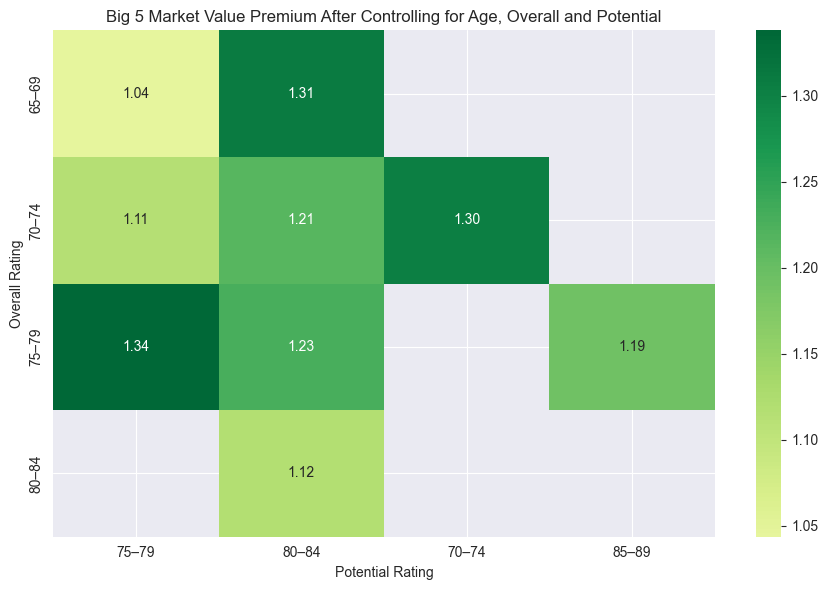

In [221]:
# Summarize the premium across age bands
premium_summary = (
    premium_after_potential
    .groupby(
        ['overall_band', 'potential_band'],
        observed=True
    )
    .agg(
        Median_Premium=('Premium Ratio', 'median'),
        Comparable_Age_Groups=('Premium Ratio', 'size')
    )
    .reset_index()
)

premium_heatmap_controlled = premium_summary.pivot(
    index='overall_band',
    columns='potential_band',
    values='Median_Premium'
)

plt.figure(figsize=(9, 6))

sns.heatmap(
    premium_heatmap_controlled,
    annot=True,
    fmt='.2f',
    cmap='RdYlGn',
    center=1
)

plt.xlabel('Potential Rating')
plt.ylabel('Overall Rating')
plt.title(
    'Big 5 Market Value Premium After Controlling for Age, Overall and Potential'
)

plt.tight_layout()
plt.show()

The Big 5 premium remains after approximately controlling for age, Overall rating, and Potential. Across 21 comparable groups with at least 10 players in both the Big 5 and other leagues, the median Big 5-to-other-leagues value ratio is 1.16. This means that comparable Big 5 players have a median market value about 16% higher. The result suggests that league context contains additional information about player value beyond age, Overall, and Potential, although the grouped comparison does not establish a causal league effect.

Some Overall–Potential combinations are supported by only one or a few comparable age groups, so individual heatmap cells should be interpreted more cautiously than the overall pattern.

In [44]:
######################################################## Young Talent by League
# Next, we examine whether some leagues contain relatively high-potential young players at lower market values, which may indicate interesting scouting markets.

In [222]:
df['potential_gap'] = df['potential'] - df['overall']

young_players = df[df['age'] <= 23].copy()

young_players['high_potential'] = (
    young_players['potential'] >= 80
).astype(int)

young_league_summary = (
    young_players.groupby('league_name')
    .agg(
        Young_Players=('value_eur', 'size'),
        Median_Value=('value_eur', 'median'),
        Median_Overall=('overall', 'median'),
        Median_Potential=('potential', 'median'),
        Median_Potential_Gap=('potential_gap', 'median'),
        High_Potential_Rate=('high_potential', 'mean')
    )
    .reset_index()
)

young_league_summary['Median Value (€M)'] = (
    young_league_summary['Median_Value'] / 1_000_000
)

young_league_summary['High Potential (%)'] = (
    young_league_summary['High_Potential_Rate'] * 100
)

# Avoid interpreting leagues with very few young players
young_league_summary = young_league_summary[
    young_league_summary['Young_Players'] >= 10
]

display(
    young_league_summary.sort_values(
        'Median_Potential',
        ascending=False
    ).round(2)
)

,league_name,Young_Players,Median_Value,Median_Overall,Median_Potential,Median_Potential_Gap,High_Potential_Rate,Median Value (€M),High Potential (%)
36,Spain Primera Division,22,14500000.0,75.5,84.5,8.0,0.95,14.50,95.45
13,English Premier League,42,15500000.0,76.5,84.0,6.5,0.93,15.50,92.86
42,Ukrainian Premier League,11,6500000.0,73.0,83.0,10.0,0.73,6.50,72.73
16,German 1. Bundesliga,56,8000000.0,74.5,82.0,7.0,0.73,8.00,73.21
20,Italian Serie A,52,5500000.0,73.0,81.0,8.0,0.65,5.50,65.38
15,French Ligue 1,78,7250000.0,74.0,81.0,7.0,0.72,7.25,71.79
32,Russian Premier League,14,4000000.0,71.5,79.0,7.5,0.43,4.00,42.86
0,Argentina Primera División,73,2500000.0,69.0,78.0,9.0,0.29,2.50,28.77
39,Turkish Süper Lig,32,3550000.0,70.5,78.0,8.0,0.28,3.55,28.12
29,Portuguese Liga ZON SAGRES,56,2800000.0,69.0,78.0,9.0,0.39,2.80,39.29


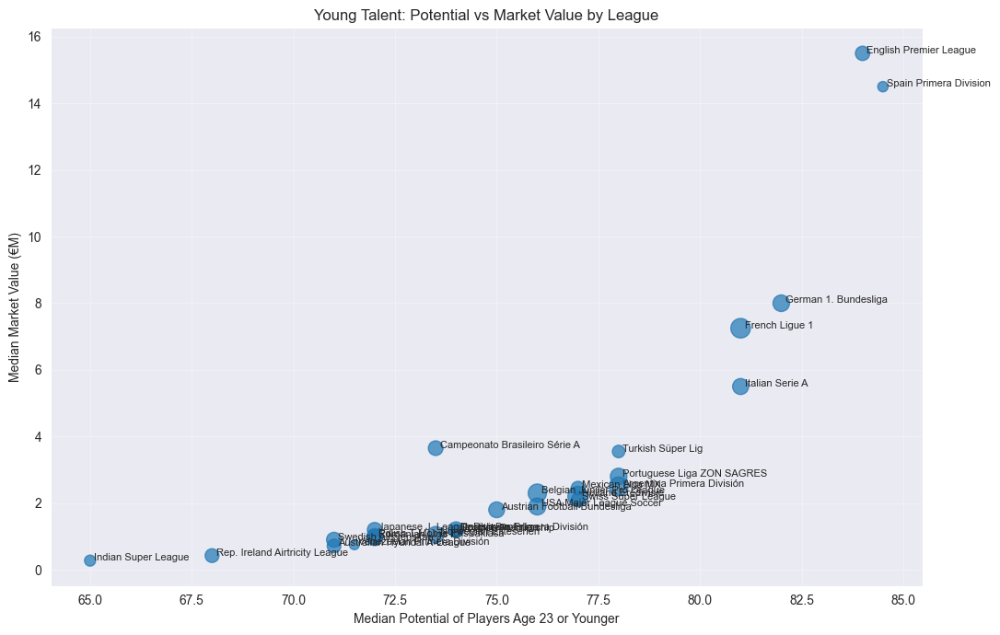

In [223]:
plot_data = young_league_summary[
    young_league_summary['Young_Players'] >= 20
]

plt.figure(figsize=(11, 7))

plt.scatter(
    plot_data['Median_Potential'],
    plot_data['Median Value (€M)'],
    s=plot_data['Young_Players'] * 3,
    alpha=0.7
)

for _, row in plot_data.iterrows():
    plt.text(
        row['Median_Potential'] + 0.1,
        row['Median Value (€M)'],
        row['league_name'],
        fontsize=8
    )

plt.xlabel('Median Potential of Players Age 23 or Younger')
plt.ylabel('Median Market Value (€M)')
plt.title('Young Talent: Potential vs Market Value by League')

plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

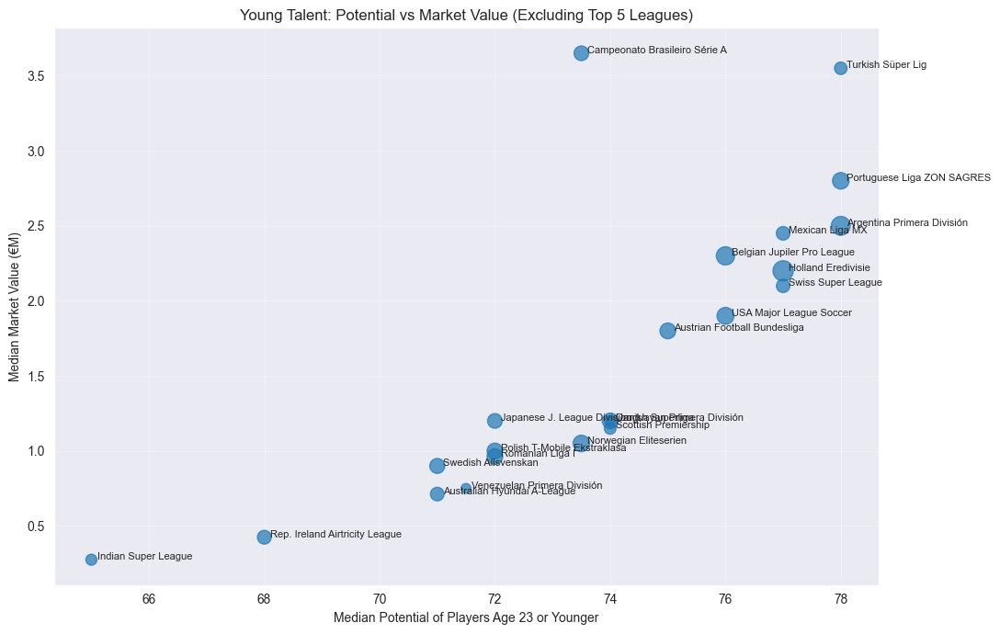

In [224]:
# Create the initial plot_data
plot_data = young_league_summary[
    young_league_summary['Young_Players'] >= 20
].copy()

# 1. Define the top 5 leagues to exclude
top5_leagues_names = [
    'English Premier League',
    'Spain Primera Division',
    'Italian Serie A',
    'German 1. Bundesliga',
    'French Ligue 1'
]

# 2. Filter OUT the top 5 leagues using the '~' (NOT) operator
plot_data = plot_data[~plot_data['league_name'].isin(top5_leagues_names)]


# --- The rest of your plotting code remains the same ---
plt.figure(figsize=(11, 7))

plt.scatter(
    plot_data['Median_Potential'],
    plot_data['Median Value (€M)'],
    s=plot_data['Young_Players'] * 3,
    alpha=0.7
)

for _, row in plot_data.iterrows():
    plt.text(
        row['Median_Potential'] + 0.1,
        row['Median Value (€M)'],
        row['league_name'],
        fontsize=8
    )

plt.xlabel('Median Potential of Players Age 23 or Younger')
plt.ylabel('Median Market Value (€M)')
plt.title('Young Talent: Potential vs Market Value (Excluding Top 5 Leagues)')

plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Brazilian league players show an unusual pattern in this dataset, with Potential frequently equal to Overall. This may reflect a dataset-specific limitation and should be interpreted cautiously.

In [48]:
################################################Contract Length and Market Value
#We first examine whether players with more years remaining on their contracts tend to have higher market values.

In [225]:
contract_summary = (
    df.groupby('contract_years_left')
    .agg(
        Players=('value_eur', 'size'),
        Median_Value=('value_eur', 'median'),
        Median_Overall=('overall', 'median'),
        Median_Potential=('potential', 'median'),
        Median_Age=('age', 'median')
    )
    .reset_index()
)

contract_summary['Median Value (€M)'] = (
    contract_summary['Median_Value'] / 1_000_000
)

display(
    contract_summary[
        [
            'contract_years_left',
            'Players',
            'Median Value (€M)',
            'Median_Overall',
            'Median_Potential',
            'Median_Age'
        ]
    ].round(2)
)

,contract_years_left,Players,Median Value (€M),Median_Overall,Median_Potential,Median_Age
0,0,910,0.8,66.0,68.0,29.0
1,1,2045,1.3,68.0,71.0,28.0
2,2,1340,1.8,70.0,73.0,27.0
3,3,1075,2.8,72.0,75.0,25.0
4,4,428,3.3,72.0,77.0,24.0
5,5,162,4.3,73.0,79.0,25.0
6,6,7,68.0,86.0,86.0,25.0
7,7,1,30.0,81.0,82.0,27.0
8,10,1,12.0,75.0,85.0,23.0


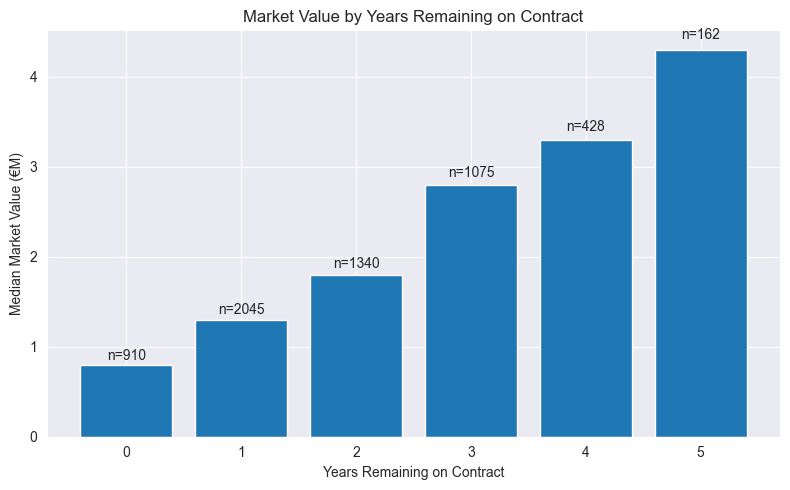

In [226]:
contract_plot = contract_summary[
    contract_summary['contract_years_left'].between(0, 5)
]

plt.figure(figsize=(8, 5))

bars = plt.bar(
    contract_plot['contract_years_left'],
    contract_plot['Median Value (€M)']
)

for bar, count in zip(bars, contract_plot['Players']):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() * 1.02,
        f'n={count}',
        ha='center',
        va='bottom'
    )

plt.xlabel('Years Remaining on Contract')
plt.ylabel('Median Market Value (€M)')
plt.title('Market Value by Years Remaining on Contract')

plt.tight_layout()
plt.show()

At first glance, players with longer contracts have substantially higher market values. However, these players also tend to be younger and have higher Overall and Potential ratings. Therefore, the raw relationship cannot be interpreted as an independent contract-length effect.

In [227]:
df['contract_group'] = pd.cut(
    df['contract_years_left'],
    bins=[-1, 1, 3, 5],
    labels=['0–1 years', '2–3 years', '4–5 years']
)

contract_controlled = (
    df.dropna(subset=['contract_group'])
    .groupby(
        [
            'overall_band',
            'age_band',
            'potential_band',
            'contract_group'
        ],
        observed=True
    )
    .agg(
        Players=('value_eur', 'size'),
        Median_Value=('value_eur', 'median')
    )
    .reset_index()
)

contract_comparison = contract_controlled.pivot_table(
    index=['overall_band', 'age_band', 'potential_band'],
    columns='contract_group',
    values=['Players', 'Median_Value'],
    observed=True
)

reliable_contract_groups = (
    (contract_comparison[('Players', '0–1 years')] >= 10)
    &
    (contract_comparison[('Players', '4–5 years')] >= 10)
)

contract_comparison = contract_comparison[
    reliable_contract_groups
].copy()

contract_comparison['Long / Short Value Ratio'] = (
    contract_comparison[('Median_Value', '4–5 years')]
    /
    contract_comparison[('Median_Value', '0–1 years')]
)

contract_result = (
    contract_comparison['Long / Short Value Ratio']
    .reset_index()
)

display(contract_result.round(2))

print(
    'Number of reliable comparable groups:',
    len(contract_result)
)

print(
    'Median long-contract / short-contract value ratio:',
    round(
        contract_result['Long / Short Value Ratio'].median(),
        2
    )
)

,overall_band,age_band,potential_band,Long / Short Value Ratio
0,≤64,≤20,70–74,0.85
1,≤64,21–23,≤69,0.97
2,≤64,21–23,70–74,0.97
3,≤64,24–26,≤69,0.81
4,65–69,≤20,75–79,1.11
5,65–69,21–23,70–74,0.97
6,65–69,21–23,75–79,1.11
7,65–69,24–26,70–74,1.13
8,65–69,27–29,≤69,1.14
9,65–69,30–32,≤69,0.90


Number of reliable comparable groups: 21
Median long-contract / short-contract value ratio: 1.05


After approximately controlling for age, Overall and Potential, the apparent contract-length effect becomes much smaller. Across 21 reliable comparable groups, players with 4–5 years remaining have a median value only about 5% higher than players with 0–1 years remaining, and the direction of the difference is not consistent across all groups. Contract length therefore appears to provide relatively limited additional information once the main player characteristics are taken into account.

In [52]:
############################# Position and Market Value

In [228]:
top10_threshold = df['value_eur'].quantile(0.90)
df['is_top10'] = (df['value_eur'] >= top10_threshold).astype(int)

position_summary = (
    df.groupby('formation')
    .agg(
        Players=('value_eur', 'size'),
        Median_Value=('value_eur', 'median'),
        Mean_Value=('value_eur', 'mean'),
        Median_Overall=('overall', 'median'),
        Median_Potential=('potential', 'median'),
        Top10_Rate=('is_top10', 'mean')
    )
    .reset_index()
)

position_summary['Median Value (€M)'] = position_summary['Median_Value'] / 1_000_000
position_summary['Mean Value (€M)'] = position_summary['Mean_Value'] / 1_000_000
position_summary['Top 10% Rate (%)'] = position_summary['Top10_Rate'] * 100
position_summary = position_summary.sort_values('Median Value (€M)', ascending=False)

display(
    position_summary[['formation', 'Players', 'Median Value (€M)', 'Mean Value (€M)',
                       'Median_Overall', 'Median_Potential', 'Top 10% Rate (%)']].round(2)
)

,formation,Players,Median Value (€M),Mean Value (€M),Median_Overall,Median_Potential,Top 10% Rate (%)
1,att,1085,1.9,6.70,70.0,73.0,12.63
3,mid,2154,1.8,5.68,69.0,73.0,11.23
2,def,2187,1.3,4.11,68.0,72.0,7.68
0,GK,543,1.1,4.68,70.0,73.0,9.58


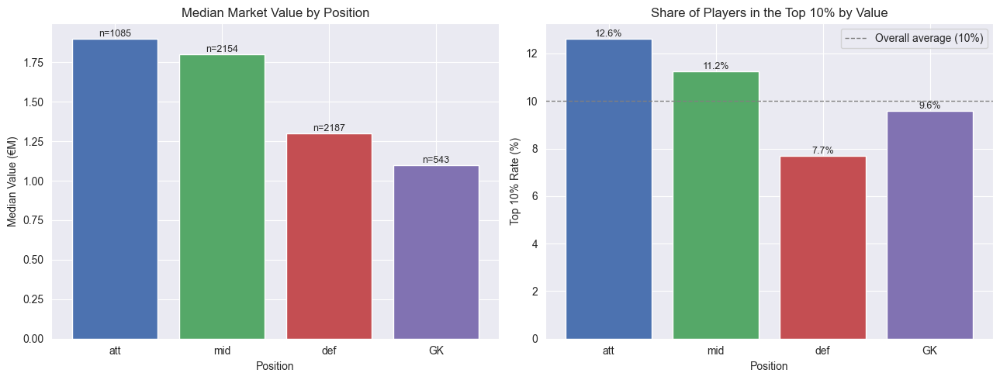

In [229]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
colors = ['#4C72B0', '#55A868', '#C44E52', '#8172B2']

bars0 = axes[0].bar(position_summary['formation'], position_summary['Median Value (€M)'], color=colors)
for bar, n in zip(bars0, position_summary['Players']):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height(), f'n={n}',
                 ha='center', va='bottom', fontsize=9)
axes[0].set_title('Median Market Value by Position')
axes[0].set_xlabel('Position')
axes[0].set_ylabel('Median Value (€M)')

bars1 = axes[1].bar(position_summary['formation'], position_summary['Top 10% Rate (%)'], color=colors)
axes[1].axhline(10, linestyle='--', color='gray', linewidth=1, label='Overall average (10%)')
for bar, v in zip(bars1, position_summary['Top 10% Rate (%)']):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height(), f'{v:.1f}%',
                 ha='center', va='bottom', fontsize=9)
axes[1].set_title('Share of Players in the Top 10% by Value')
axes[1].set_xlabel('Position')
axes[1].set_ylabel('Top 10% Rate (%)')
axes[1].legend()

plt.tight_layout()
plt.show()

Value is not evenly distributed across positions. Attackers are the smallest position group (1,085 players) but have the highest median and mean value, and appear in the top 10% almost 1.6 times as often as defenders (12.6% vs 7.7%). Median Overall and Potential are relatively similar across the four position groups, suggesting that differences in player ratings alone may not explain the full value gap.

In [230]:
outfield = df[df['formation'] != 'GK'].copy()

position_controlled = (
    outfield.groupby(['overall_band', 'age_band', 'potential_band', 'formation'], observed=True)
    .agg(Players=('value_eur', 'size'), Median_Value=('value_eur', 'median'))
    .reset_index()
)

position_pivot = position_controlled.pivot_table(
    index=['overall_band', 'age_band', 'potential_band'],
    columns='formation',
    values=['Players', 'Median_Value'],
    observed=True
)

premium_rows = []
for pos in ['att', 'mid']:
    reliable = (position_pivot[('Players', pos)] >= 10) & (position_pivot[('Players', 'def')] >= 10)
    sub = position_pivot[reliable].copy()
    sub['Premium Ratio'] = sub[('Median_Value', pos)] / sub[('Median_Value', 'def')]
    sub = sub['Premium Ratio'].reset_index()
    sub['vs_def'] = pos
    premium_rows.append(sub)

position_premium = pd.concat(premium_rows, ignore_index=True)

print('Reliable comparable groups per position:')
print(position_premium.groupby('vs_def').size())
print()
print('Median premium ratio (position vs. defenders, same overall/age/potential):')
print(position_premium.groupby('vs_def')['Premium Ratio'].median().round(2))

# Collapse the age dimension (median across age bands) for a 2D heatmap, same approach as your Big5 section
premium_2d = (
    position_premium
    .groupby(['overall_band', 'potential_band', 'vs_def'], observed=True)
    .agg(Median_Premium=('Premium Ratio', 'median'), Comparable_Age_Groups=('Premium Ratio', 'size'))
    .reset_index()
)

Reliable comparable groups per position:
vs_def
att    32
mid    33
dtype: int64

Median premium ratio (position vs. defenders, same overall/age/potential):
vs_def
att    1.11
mid    1.06
Name: Premium Ratio, dtype: float64


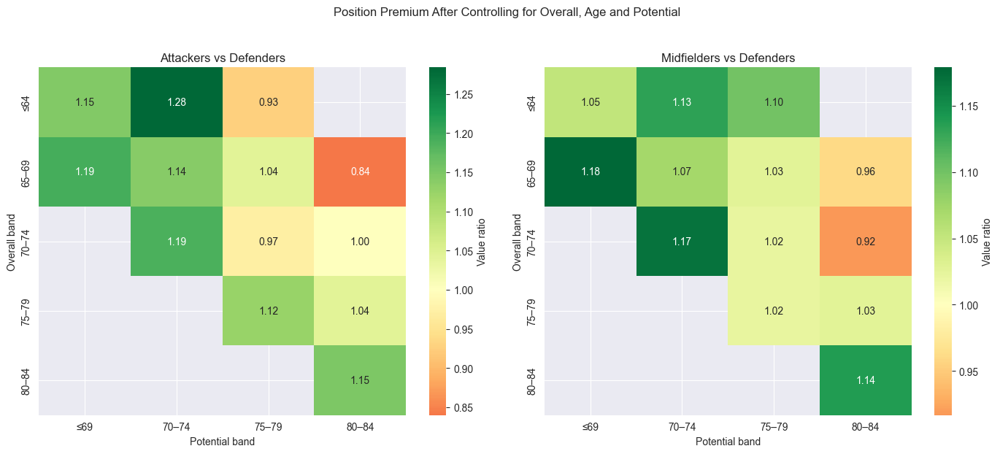

In [231]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

for ax, pos, label in zip(axes, ['att', 'mid'], ['Attackers vs Defenders', 'Midfielders vs Defenders']):
    sub = premium_2d[premium_2d['vs_def'] == pos]
    heat = sub.pivot(index='overall_band', columns='potential_band', values='Median_Premium')
    sns.heatmap(heat, annot=True, fmt='.2f', cmap='RdYlGn', center=1, ax=ax,
                cbar_kws={'label': 'Value ratio'})
    ax.set_title(label)
    ax.set_xlabel('Potential band')
    ax.set_ylabel('Overall band')

plt.suptitle('Position Premium After Controlling for Overall, Age and Potential', y=1.03)
plt.tight_layout()
plt.show()

After approximately controlling for Overall, Potential and Age by comparing players within the same rating, age and potential bands, attackers have a median value about 11% higher than defenders, while midfielders are about 6% higher. These results are based on 32 and 33 reliable comparable groups respectively, with at least 10 players in both groups being compared. This suggests that position contains some additional information about market value beyond age, Overall and Potential. As with the league analysis, this is an association rather than a causal effect, and individual high-rating cells with fewer comparable groups should be interpreted cautiously.

# Feature Selection for Value Estimation

Based on the exploratory analysis, features were selected according to their observed relationship with market value, their football interpretation, and their ability to generalize to unseen players.

Identifiers, player names, club names, height, weight, and preferred foot are excluded. The model focuses on player quality, future potential, age, technical ability, playing role, league context, and contract length.

In [57]:
big5_mapping = {
    'English Premier League': 'Premier League',
    'Spain Primera Division': 'La Liga',
    'German 1. Bundesliga': 'Bundesliga',
    'Italian Serie A': 'Serie A',
    'French Ligue 1': 'Ligue 1'
}

df['league_group'] = (
    df['league_name']
    .map(big5_mapping)
    .fillna('Other')
)


selected_features = [
    'overall',
    'potential',
    'age',
    'contract_years_left',

    'pace',
    'shooting',
    'passing',
    'dribbling',
    'defending',
    'physic',

    'formation',
    'league_group',

    'number_of_tags'
]

feature_explanations

'overall',
     'Summarizes current playing ability and shows a strong relationship with market value.'

'potential',
     'Captures future upside and is one of the strongest indicators of player value.'

'age',
     'Players with similar ability have substantially different values across age groups, reflecting a strong youth premium.'

'league_group',
     'The original league variable contains many categories, which could create sparse features and increase the risk of overfitting. Based on the EDA, the five major European leagues are retained as separate categories, while all remaining leagues are grouped into Other. This preserves the market-context information observed in the data while keeping the representation compact and more generalizable.'

'formation',
     'Represents playing role, which helps interpret technical attributes and is associated with value differences between comparable players.'

'contract_years_left',
     'Shows a limited but potentially useful additional association with value after controlling for the main player characteristics.'

'pace',
     'Captures an important physical/technical attribute, particularly for attacking and wide roles.'

'shooting',
     'Provides role-specific attacking information and is particularly informative for attackers.'

'passing',
     'Captures creation and distribution ability and is particularly informative for midfielders.'

'dribbling',
     'Provides additional attacking and midfield quality information beyond basic ratings.'

'defending',
     'Captures role-specific defensive ability and is particularly informative for defenders.'

'physic',
     'Captures physical ability that may help distinguish players within similar roles and ratings.

`club_name` was excluded despite potentially containing predictive information because of its high cardinality and the risk of memorizing specific clubs. Instead, `league_group` is retained as a more compact and generalizable representation of market context.

Goalkeeper missing values: The six outfield skill attributes (pace, shooting, passing, dribbling, defending, and physic) are missing exclusively for goalkeepers. These are structural missing values rather than data errors.

# Top 10% Player Classification

In [58]:
top10_threshold = df['value_eur'].quantile(0.90)

df['top_10_percent'] = (
    df['value_eur'] >= top10_threshold
).astype(int)

print(f'Top 10% threshold: €{top10_threshold / 1_000_000:.2f}M')

print(
    df['top_10_percent']
    .value_counts()
    .rename(index={0: 'Not Top 10%', 1: 'Top 10%'})
)

print(
    '\nClass distribution (%)'
)

print(
    (
        df['top_10_percent']
        .value_counts(normalize=True)
        .rename(index={0: 'Not Top 10%', 1: 'Top 10%'})
        * 100
    ).round(2)
)

Top 10% threshold: €13.00M
top_10_percent
Not Top 10%    5370
Top 10%         599
Name: count, dtype: int64

Class distribution (%)
top_10_percent
Not Top 10%    89.96
Top 10%        10.04
Name: proportion, dtype: float64


Market Value Regression

The first modeling task is to predict each player's market value as a continuous variable.

The data is divided into training and test sets. The test set is kept completely separate during model selection and will only be used for final evaluation.

Because market value is highly skewed, the split is stratified by market-value quantiles to maintain a similar representation of low-, medium-, and high-value players in both sets.

In [59]:
from sklearn.model_selection import train_test_split

X = df[selected_features].copy()
y = df['value_eur'].copy()

# Used only to preserve the market-value distribution during the split
value_bins = pd.qcut(
    y.rank(method='first'),
    q=50,
    labels=False
)

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    random_state=42,
    stratify=value_bins
)

print('Training set:', X_train.shape)
print('Test set:', X_test.shape)

print(f'\nTraining median value: €{y_train.median()/1_000_000:.2f}M')
print(f'Test median value:     €{y_test.median()/1_000_000:.2f}M')

print(f'\nTraining mean value: €{y_train.mean()/1_000_000:.2f}M')
print(f'Test mean value:     €{y_test.mean()/1_000_000:.2f}M')

Training set: (4775, 13)
Test set: (1194, 13)

Training median value: €1.60M
Test median value:     €1.60M

Training mean value: €5.21M
Test mean value:     €5.15M


In [60]:
quantiles = [0.50, 0.75, 0.90, 0.95, 0.99]

split_check = pd.DataFrame({
    'Train (€M)': y_train.quantile(quantiles) / 1_000_000,
    'Test (€M)': y_test.quantile(quantiles) / 1_000_000
})

display(split_check.round(2))

,Train (€M),Test (€M)
0.50,1.60,1.60
0.75,3.60,3.70
0.90,13.00,13.20
0.95,24.00,25.00
0.99,62.63,53.28


############################################### Random Forest: Incremental Feature Evaluation

To understand how much predictive information is added by different player characteristics, Random Forest models are compared using progressively richer feature sets.

The models are evaluated using cross-validation on the training set only. The test set remains untouched for final evaluation.

In [61]:
feature_sets = {
    'Overall only': [
        'overall'
    ],

    'Overall + Potential': [
        'overall',
        'potential'
    ],

    'Overall + Potential + Formation': [
        'overall',
        'potential',
        'formation'
    ],

    'Core player profile': [
        'overall',
        'potential',
        'formation',
        'age'
    ],

    'All selected features': selected_features
}

In [62]:
print("--- X (Selected Features) ---")
display(X.head())

print("\n--- y (Target Variable) ---")
display(y.head().to_frame())

--- X (Selected Features) ---


,overall,potential,age,contract_years_left,pace,shooting,passing,dribbling,defending,physic,formation,league_group,number_of_tags
0,67,80,19,1,83.0,61.0,61.0,72.0,22.0,43.0,mid,Other,0
1,70,82,20,4,72.0,70.0,65.0,71.0,50.0,60.0,mid,Other,0
2,68,68,31,1,75.0,62.0,67.0,69.0,57.0,59.0,mid,Other,0
3,75,75,33,1,71.0,69.0,76.0,78.0,33.0,60.0,mid,Other,0
4,73,82,23,1,78.0,69.0,72.0,75.0,40.0,56.0,mid,La Liga,0



--- y (Target Variable) ---


,value_eur
0,2400000.0
1,3800000.0
2,1000000.0
3,3500000.0
4,7000000.0


In [63]:
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, cross_validate


categorical_columns = [
    'formation',
    'league_group'
]

cv = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

results = []

for feature_set_name, features in feature_sets.items():

    current_categorical = [
        col for col in categorical_columns
        if col in features
    ]

    current_numeric = [
        col for col in features
        if col not in current_categorical
    ]

    preprocessor = ColumnTransformer([
        (
            'numeric',
            'passthrough',
            current_numeric
        ),
        (
            'categorical',
            OneHotEncoder(
                handle_unknown='ignore',
                sparse_output=False
            ),
            current_categorical
        )
    ])

    # =========================================================
    # 1. Random Forest on raw market value
    # =========================================================
    regular_model = Pipeline([
        ('preprocessor', preprocessor),
        ('model', RandomForestRegressor(
            n_estimators=500,
            random_state=42,
            n_jobs=1
        ))
    ])

    regular_scores = cross_validate(
        regular_model,
        X_train[features],
        y_train,
        cv=cv,
        scoring={
            'r2': 'r2',
            'mae': 'neg_mean_absolute_error',
            'rmse': 'neg_root_mean_squared_error'
        },
        n_jobs=-1
    )

    results.append({
        'Feature Set': feature_set_name,
        'Target': 'Raw value',
        'Number of Features': len(features),

        'R² Mean': regular_scores['test_r2'].mean(),
        'R² Std': regular_scores['test_r2'].std(),

        'MAE Mean (€M)': -regular_scores['test_mae'].mean() / 1_000_000,
        'MAE Std (€M)': regular_scores['test_mae'].std() / 1_000_000,

        'RMSE Mean (€M)': -regular_scores['test_rmse'].mean() / 1_000_000,
        'RMSE Std (€M)': regular_scores['test_rmse'].std() / 1_000_000
    })

    # =========================================================
    # 2. Random Forest on log-transformed market value
    # =========================================================
    log_pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('model', RandomForestRegressor(
            n_estimators=500,
            random_state=42,
            n_jobs=1
        ))
    ])

    log_model = TransformedTargetRegressor(
        regressor=log_pipeline,
        func=np.log1p,
        inverse_func=np.expm1
    )

    log_scores = cross_validate(
        log_model,
        X_train[features],
        y_train,
        cv=cv,
        scoring={
            'r2': 'r2',
            'mae': 'neg_mean_absolute_error',
            'rmse': 'neg_root_mean_squared_error'
        },
        n_jobs=-1
    )

    results.append({
        'Feature Set': feature_set_name,
        'Target': 'Log value',
        'Number of Features': len(features),

        'R² Mean': log_scores['test_r2'].mean(),
        'R² Std': log_scores['test_r2'].std(),

        'MAE Mean (€M)': -log_scores['test_mae'].mean() / 1_000_000,
        'MAE Std (€M)': log_scores['test_mae'].std() / 1_000_000,

        'RMSE Mean (€M)': -log_scores['test_rmse'].mean() / 1_000_000,
        'RMSE Std (€M)': log_scores['test_rmse'].std() / 1_000_000
    })


rf_feature_results = pd.DataFrame(results)

display(
    rf_feature_results.round({
        'R² Mean': 3,
        'R² Std': 3,
        'MAE Mean (€M)': 2,
        'MAE Std (€M)': 2,
        'RMSE Mean (€M)': 2,
        'RMSE Std (€M)': 2
    })
)

,Feature Set,Target,Number of Features,R² Mean,R² Std,MAE Mean (€M),MAE Std (€M),RMSE Mean (€M),RMSE Std (€M)
0,Overall only,Raw value,1,0.813,0.055,1.73,0.16,5.04,0.79
1,Overall only,Log value,1,0.794,0.044,1.79,0.12,5.33,0.68
2,Overall + Potential,Raw value,2,0.899,0.044,0.95,0.10,3.65,0.71
3,Overall + Potential,Log value,2,0.890,0.041,1.01,0.10,3.85,0.69
4,Overall + Potential + Formation,Raw value,3,0.915,0.032,0.81,0.09,3.38,0.58
5,Overall + Potential + Formation,Log value,3,0.907,0.028,0.86,0.10,3.56,0.57
6,Core player profile,Raw value,4,0.975,0.013,0.34,0.04,1.80,0.51
7,Core player profile,Log value,4,0.981,0.010,0.32,0.04,1.59,0.50
8,All selected features,Raw value,13,0.961,0.025,0.38,0.07,2.20,0.72
9,All selected features,Log value,13,0.970,0.015,0.35,0.05,1.99,0.62


Incremental Feature Results

The incremental feature analysis shows that `Overall` alone provides substantial predictive power, while adding `Potential` and `Formation` improves performance further. The largest improvement occurs when `Age` is added, which is consistent with the strong age-related market value patterns observed during the EDA.

The best-performing configuration is the **Core player profile** (`Overall`, `Potential`, `Formation`, and `Age`) with a log-transformed target. Across five cross-validation folds, it achieves an average R² of **0.981 ± 0.010**, an MAE of **€0.32M ± €0.04M**, and an RMSE of **€1.59M ± €0.50M**.

Using all 13 selected features does not improve the Random Forest. With the log-transformed target, R² decreases to **0.970 ± 0.015**, while MAE and RMSE increase to **€0.35M ± €0.05M** and **€1.99M ± €0.62M**, respectively. This suggests that some of the additional features may introduce noise or redundant information rather than improving generalization.

For the richer feature sets, the log-transformed target performs better than the raw target across all three evaluation metrics. Therefore, the following feature-selection experiments use the log-transformed target while continuing to evaluate predictions in the original euro scale.

######################################################## Tree-Based Model Tuning ##############################

Random Forest and XGBoost are evaluated using Grid Search with 5-fold cross-validation on the training data only.

Both the original market value and a log-transformed target are tested.

The same selected feature set is used for all models, allowing a direct comparison between algorithms and target transformations. Model selection is based primarily on RMSE, while R² and MAE are also reported.

In [64]:
from xgboost import XGBRegressor

categorical_features = [
    'formation',
    'league_group'
]

numeric_features = [
    feature
    for feature in selected_features
    if feature not in categorical_features
]


tree_preprocessor = ColumnTransformer([
    (
        'numeric',
        'passthrough',
        numeric_features
    ),
    (
        'categorical',
        OneHotEncoder(
            handle_unknown='ignore',
            sparse_output=False
        ),
        categorical_features
    )
])


cv = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)



In [70]:
rf_param_grid = {
    'n_estimators': [ 200,  300, 400],
    'criterion': ['squared_error'],
    'max_depth': [4, 6, 7, 8, 9, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 3, 4],
    'max_features': ['sqrt', 0.7, 1.0],
    'bootstrap': [True, False]
}

In [71]:
xgb_param_grid = {
    'n_estimators': [ 200, 300, 400],
    'max_depth': [3,4, 5],
    'learning_rate': [0.015, 0.03, 0.08],
    'min_child_weight': [1, 3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1],
    'reg_alpha': [0,0.1],
    'reg_lambda': [1, 5]
}

In [72]:
from sklearn.model_selection import GridSearchCV, ParameterGrid


n_rf = len(list(ParameterGrid(rf_param_grid)))
n_xgb = len(list(ParameterGrid(xgb_param_grid)))

print('Random Forest combinations:', n_rf)
print('XGBoost combinations:', n_xgb)

print(
    'Total CV fits for Raw + Log:',
    (n_rf + n_xgb) * 5 * 2
)

Random Forest combinations: 1296
XGBoost combinations: 1728
Total CV fits for Raw + Log: 30240


In [73]:
models = {
    'Random Forest': {
        'estimator': RandomForestRegressor(
            random_state=42,
            n_jobs=1
        ),
        'param_grid': rf_param_grid
    },

    'XGBoost': {
        'estimator': XGBRegressor(
            objective='reg:squarederror',
            random_state=42,
            n_jobs=1,
            tree_method='hist'
        ),
        'param_grid': xgb_param_grid
    }
}

In [75]:
rmse_grid_results = []
rmse_grid_searches = {}

for model_name, model_info in models.items():

    for target_type in ['Raw value', 'Log value']:

        print('\n' + '=' * 70)
        print(f'{model_name} | {target_type}')
        print('=' * 70)

        pipeline = Pipeline([
            ('preprocessor', tree_preprocessor),
            ('model', model_info['estimator'])
        ])

        # --------------------------------------------------
        # Raw target
        # --------------------------------------------------
        if target_type == 'Raw value':

            estimator = pipeline

            param_grid = {
                f'model__{param}': values
                for param, values
                in model_info['param_grid'].items()
            }

        # --------------------------------------------------
        # Log-transformed target
        # --------------------------------------------------
        else:

            estimator = TransformedTargetRegressor(
                regressor=pipeline,
                func=np.log1p,
                inverse_func=np.expm1
            )

            param_grid = {
                f'regressor__model__{param}': values
                for param, values
                in model_info['param_grid'].items()
            }

        # --------------------------------------------------
        # Grid Search
        # --------------------------------------------------
        grid = GridSearchCV(
            estimator=estimator,
            param_grid=param_grid,
            scoring={
                'r2': 'r2',
                'mae': 'neg_mean_absolute_error',
                'rmse': 'neg_root_mean_squared_error'
            },
            refit='rmse',
            cv=cv,
            n_jobs=-1,
            verbose=1,
            return_train_score=False
        )

        grid.fit(
            X_train[selected_features],
            y_train
        )

        rmse_grid_searches[(model_name, target_type)] = grid

        best_idx = grid.best_index_
        cv_results = grid.cv_results_

        rmse_grid_results.append({
            'Model': model_name,
            'Target': target_type,

            'R² Mean':
                cv_results['mean_test_r2'][best_idx],

            'R² Std':
                cv_results['std_test_r2'][best_idx],

            'MAE Mean (€M)':
                -cv_results['mean_test_mae'][best_idx]
                / 1_000_000,

            'MAE Std (€M)':
                cv_results['std_test_mae'][best_idx]
                / 1_000_000,

            'RMSE Mean (€M)':
                -cv_results['mean_test_rmse'][best_idx]
                / 1_000_000,

            'RMSE Std (€M)':
                cv_results['std_test_rmse'][best_idx]
                / 1_000_000,

            'Best Parameters':
                grid.best_params_
        })

        print(
            f"Best CV RMSE: "
            f"{-grid.best_score_ / 1_000_000:.3f} €M"
        )


Random Forest | Raw value
Fitting 5 folds for each of 1296 candidates, totalling 6480 fits
Best CV RMSE: 2.015 €M

Random Forest | Log value
Fitting 5 folds for each of 1296 candidates, totalling 6480 fits
Best CV RMSE: 1.703 €M

XGBoost | Raw value
Fitting 5 folds for each of 1728 candidates, totalling 8640 fits
Best CV RMSE: 1.387 €M

XGBoost | Log value
Fitting 5 folds for each of 1728 candidates, totalling 8640 fits
Best CV RMSE: 1.063 €M


In [76]:
tree_grid_results = pd.DataFrame(rmse_grid_results)

display(
    tree_grid_results[
        [
            'Model',
            'Target',
            'R² Mean',
            'R² Std',
            'MAE Mean (€M)',
            'MAE Std (€M)',
            'RMSE Mean (€M)',
            'RMSE Std (€M)'
        ]
    ].round(3)
)

,Model,Target,R² Mean,R² Std,MAE Mean (€M),MAE Std (€M),RMSE Mean (€M),RMSE Std (€M)
0,Random Forest,Raw value,0.969,0.015,0.377,0.053,2.015,0.617
1,Random Forest,Log value,0.978,0.013,0.337,0.051,1.703,0.607
2,XGBoost,Raw value,0.985,0.009,0.317,0.032,1.387,0.558
3,XGBoost,Log value,0.991,0.007,0.287,0.034,1.063,0.464


### Tree-Based Model Comparison

After hyperparameter tuning, XGBoost clearly outperformed Random Forest across all evaluation metrics. For both algorithms, modeling the logarithm of market value produced better cross-validation performance than modeling the raw target directly.

The best-performing configuration was XGBoost with a log-transformed target, achieving an average R² of **0.991 ± 0.007**, an MAE of **€0.287M ± €0.034M**, and an RMSE of **€1.063M ± €0.464M** across five cross-validation folds.

The improvement from the log transformation was particularly noticeable in RMSE, indicating that compressing the highly skewed market-value distribution helps the models generalize better across the full range of player values. XGBoost also showed lower variability between folds than Random Forest, suggesting more stable performance.

These results are based exclusively on cross-validation within the training set; The held-out test set is not used for model fitting, hyperparameter tuning, or model selection, and is reserved for the final model evaluation.

In [78]:
for (model_name, target_type), grid in rmse_grid_searches.items():

    print('\n' + '=' * 70)
    print(f'{model_name} | {target_type}')
    print('=' * 70)

    for param, value in grid.best_params_.items():

        clean_param = (
            param
            .replace('regressor__model__', '')
            .replace('model__', '')
        )

        print(f'{clean_param}: {value}')


Random Forest | Raw value
bootstrap: False
criterion: squared_error
max_depth: None
max_features: 0.7
min_samples_leaf: 1
min_samples_split: 2
n_estimators: 200

Random Forest | Log value
bootstrap: False
criterion: squared_error
max_depth: None
max_features: 0.7
min_samples_leaf: 2
min_samples_split: 5
n_estimators: 400

XGBoost | Raw value
colsample_bytree: 1.0
gamma: 0
learning_rate: 0.08
max_depth: 4
min_child_weight: 1
n_estimators: 400
reg_alpha: 0
reg_lambda: 1
subsample: 0.8

XGBoost | Log value
colsample_bytree: 1.0
gamma: 0
learning_rate: 0.03
max_depth: 4
min_child_weight: 3
n_estimators: 400
reg_alpha: 0
reg_lambda: 1
subsample: 0.8


In [118]:
xgb_log_best_params = {
    'colsample_bytree': 1.0,
    'gamma': 0,
    'learning_rate': 0.03,
    'max_depth': 4,
    'min_child_weight': 3,
    'n_estimators': 400,
    'reg_alpha': 0,
    'reg_lambda': 1,
    'subsample': 0.8
}

## Model Selection with Emphasis on High-Value Players

The initial model comparison focused on overall regression performance using R², MAE, and RMSE. However, the business objective is not only to estimate player values accurately across the full market, but also to identify the most valuable players reliably.

A model can achieve strong overall regression performance while still performing poorly in the upper tail of the market-value distribution. Therefore, the model-selection process is extended to explicitly evaluate performance on the top 10% most valuable players.

Random Forest and XGBoost are compared using 5-fold cross-validation on the training set only. Both the raw and log-transformed market-value targets are evaluated. All preprocessing is performed within the model pipeline to prevent information leakage between folds.

For every validation fold, the models are evaluated from two complementary perspectives:

- **Overall value prediction:** R², MAE, and RMSE across all players.
- **High-value player performance:** the ability to identify the top 10% of players, together with the MAE and RMSE specifically within this high-value group.

The top 10% is defined relative to the data in each validation fold rather than by using a fixed monetary threshold. This makes the evaluation applicable to datasets with different market-value distributions.

Hyperparameters are selected according to performance in identifying the top 10%, while the general regression metrics are retained to ensure that improvement in the high-value segment does not come at the expense of overall predictive performance.

In [89]:
from sklearn.metrics import (
    make_scorer,
    precision_score,
    recall_score,
    f1_score
)

def top10_labels(values):
    values = np.asarray(values)

    n_top = int(round(0.10 * len(values)))

    top_indices = np.argsort(values)[-n_top:]

    labels = np.zeros(len(values), dtype=int)
    labels[top_indices] = 1

    return labels

def top10_precision(y_true, y_pred):

    true_labels = top10_labels(y_true)
    pred_labels = top10_labels(y_pred)

    return precision_score(
        true_labels,
        pred_labels,
        zero_division=0
    )


def top10_recall(y_true, y_pred):

    true_labels = top10_labels(y_true)
    pred_labels = top10_labels(y_pred)

    return recall_score(
        true_labels,
        pred_labels,
        zero_division=0
    )


def top10_f1(y_true, y_pred):

    true_labels = top10_labels(y_true)
    pred_labels = top10_labels(y_pred)

    return f1_score(
        true_labels,
        pred_labels,
        zero_division=0
    )

In [90]:
def top10_mae(y_true, y_pred):

    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    top_mask = top10_labels(
        y_true
    ).astype(bool)

    return np.mean(
        np.abs(
            y_true[top_mask]
            - y_pred[top_mask]
        )
    )


def top10_rmse(y_true, y_pred):

    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    top_mask = top10_labels(
        y_true
    ).astype(bool)

    return np.sqrt(
        np.mean(
            (
                y_true[top_mask]
                - y_pred[top_mask]
            ) ** 2
        )
    )

In [91]:
scoring = {
    'r2': 'r2',

    'mae':
        'neg_mean_absolute_error',

    'rmse':
        'neg_root_mean_squared_error',

    'top10_precision':
        make_scorer(top10_precision),

    'top10_recall':
        make_scorer(top10_recall),

    'top10_f1':
        make_scorer(top10_f1),

    'top10_mae':
        make_scorer(
            top10_mae,
            greater_is_better=False
        ),

    'top10_rmse':
        make_scorer(
            top10_rmse,
            greater_is_better=False
        )
}

In [92]:
models = {
    'Random Forest': {
        'estimator': RandomForestRegressor(
            random_state=42,
            n_jobs=1
        ),
        'param_grid': rf_param_grid
    },

    'XGBoost': {
        'estimator': XGBRegressor(
            objective='reg:squarederror',
            tree_method='hist',
            random_state=42,
            n_jobs=1
        ),
        'param_grid': xgb_param_grid
    }
}

In [93]:
top10_grid_results_list = []
top10_grid_searches = {}

for model_name, model_info in models.items():

    for target_type in [
        'Raw value',
        'Log value'
    ]:

        print('\n' + '=' * 70)
        print(
            f'{model_name} | {target_type}'
        )
        print('=' * 70)

        pipeline = Pipeline([
            (
                'preprocessor',
                tree_preprocessor
            ),
            (
                'model',
                model_info['estimator']
            )
        ])

        # -----------------------------
        # Raw target
        # -----------------------------
        if target_type == 'Raw value':

            estimator = pipeline

            param_grid = {
                f'model__{param}': values
                for param, values
                in model_info[
                    'param_grid'
                ].items()
            }

        # -----------------------------
        # Log target
        # -----------------------------
        else:

            estimator = (
                TransformedTargetRegressor(
                    regressor=pipeline,
                    func=np.log1p,
                    inverse_func=np.expm1
                )
            )

            param_grid = {
                f'regressor__model__{param}':
                    values

                for param, values
                in model_info[
                    'param_grid'
                ].items()
            }

        grid = GridSearchCV(
            estimator=estimator,
            param_grid=param_grid,

            scoring=scoring,

            # This run selects parameters
            # specifically for Top-10 identification
            refit='top10_f1',

            cv=cv,
            n_jobs=-1,
            verbose=1,
            return_train_score=False
        )

        grid.fit(
            X_train[selected_features],
            y_train
        )

        top10_grid_searches[
            (model_name, target_type)
        ] = grid

        best_idx = grid.best_index_
        res = grid.cv_results_

        top10_grid_results_list.append({
            'Model':
                model_name,

            'Target':
                target_type,

            'Top 10% F1':
                res[
                    'mean_test_top10_f1'
                ][best_idx],

            'Top 10% F1 Std':
                res[
                    'std_test_top10_f1'
                ][best_idx],

            'Top 10% Precision':
                res[
                    'mean_test_top10_precision'
                ][best_idx],

            'Top 10% Recall':
                res[
                    'mean_test_top10_recall'
                ][best_idx],

            'Top 10% MAE (€M)':
                -res[
                    'mean_test_top10_mae'
                ][best_idx]
                / 1_000_000,

            'Top 10% RMSE (€M)':
                -res[
                    'mean_test_top10_rmse'
                ][best_idx]
                / 1_000_000,

            'Overall R²':
                res[
                    'mean_test_r2'
                ][best_idx],

            'Overall MAE (€M)':
                -res[
                    'mean_test_mae'
                ][best_idx]
                / 1_000_000,

            'Overall RMSE (€M)':
                -res[
                    'mean_test_rmse'
                ][best_idx]
                / 1_000_000,

            'Best Parameters':
                grid.best_params_
        })

        print(
            'Best CV Top-10 F1:',
            round(
                grid.best_score_,
                3
            )
        )


Random Forest | Raw value
Fitting 5 folds for each of 1296 candidates, totalling 6480 fits
Best CV Top-10 F1: 0.985

Random Forest | Log value
Fitting 5 folds for each of 1296 candidates, totalling 6480 fits
Best CV Top-10 F1: 0.985

XGBoost | Raw value
Fitting 5 folds for each of 1728 candidates, totalling 8640 fits
Best CV Top-10 F1: 0.985

XGBoost | Log value
Fitting 5 folds for each of 1728 candidates, totalling 8640 fits
Best CV Top-10 F1: 0.983


In [94]:
top10_grid_results = pd.DataFrame(
    top10_grid_results_list
)

display(
    top10_grid_results[
        [
            'Model',
            'Target',

            'Top 10% F1',
            'Top 10% F1 Std',
            'Top 10% Precision',
            'Top 10% Recall',

            'Top 10% MAE (€M)',
            'Top 10% RMSE (€M)',

            'Overall R²',
            'Overall MAE (€M)',
            'Overall RMSE (€M)'
        ]
    ].round(3)
)

,Model,Target,Top 10% F1,Top 10% F1 Std,Top 10% Precision,Top 10% Recall,Top 10% MAE (€M),Top 10% RMSE (€M),Overall R²,Overall MAE (€M),Overall RMSE (€M)
0,Random Forest,Raw value,0.985,0.011,0.985,0.985,2.888,6.936,0.959,0.397,2.256
1,Random Forest,Log value,0.985,0.005,0.985,0.985,2.850,6.563,0.966,0.385,2.121
2,XGBoost,Raw value,0.985,0.008,0.985,0.985,2.085,5.352,0.973,0.332,1.735
3,XGBoost,Log value,0.983,0.008,0.983,0.983,2.038,4.350,0.984,0.300,1.410


In [95]:
for (model_name, target_type), grid in top10_grid_searches.items():

    print('\n' + '=' * 70)
    print(f'{model_name} | {target_type}')
    print('=' * 70)

    for param, value in grid.best_params_.items():

        clean_param = (
            param
            .replace('regressor__model__', '')
            .replace('model__', '')
        )

        print(f'{clean_param}: {value}')


Random Forest | Raw value
bootstrap: True
criterion: squared_error
max_depth: None
max_features: 1.0
min_samples_leaf: 2
min_samples_split: 5
n_estimators: 200

Random Forest | Log value
bootstrap: True
criterion: squared_error
max_depth: None
max_features: 0.7
min_samples_leaf: 2
min_samples_split: 5
n_estimators: 400

XGBoost | Raw value
colsample_bytree: 1.0
gamma: 0
learning_rate: 0.08
max_depth: 5
min_child_weight: 3
n_estimators: 300
reg_alpha: 0
reg_lambda: 1
subsample: 0.8

XGBoost | Log value
colsample_bytree: 0.8
gamma: 0
learning_rate: 0.08
max_depth: 5
min_child_weight: 1
n_estimators: 400
reg_alpha: 0
reg_lambda: 1
subsample: 1.0


### Results

The four tree-based regression configurations achieved very strong performance in identifying the highest-value players. Random Forest with both raw and log-transformed targets, as well as XGBoost with the raw target, achieved a Top-10% F1 score of approximately 0.985. XGBoost with the log-transformed target achieved a nearly identical score of 0.983.

The very small difference in Top-10% identification suggests that all four configurations are highly effective at ranking the most valuable players. Therefore, Top-10% identification alone does not provide a strong basis for selecting between the best-performing models.

The models differ more clearly in their ability to estimate player values. XGBoost consistently outperformed Random Forest, and the log-transformed XGBoost model achieved the strongest overall regression performance. It also produced the lowest prediction error among the actual Top-10% most valuable players, particularly in terms of RMSE.

This indicates that the log-transformed XGBoost model provides the best balance between two objectives:

- correctly identifying the highest-value players; and
- accurately estimating their market values.

The log transformation appears especially useful for the highly skewed market-value distribution, allowing the model to maintain excellent Top-10% identification while improving value estimation across both the full player population and the high-value segment.

Based on the cross-validation results, **XGBoost with a log-transformed target is selected as the leading regression candidate** for the next stage of the analysis.

All results in this stage were obtained using 5-fold cross-validation on the training set only. The held-out test set remains completely untouched and is reserved for the final evaluation.

## Formation-Specific XGBoost Models

The global XGBoost model allows player formation to influence predictions through the `formation` feature. However, the relationship between player attributes and market value may differ substantially across positional groups.

To test whether additional specialization is beneficial, separate XGBoost regression models are trained for attackers, midfielders, defenders, and goalkeepers.

Each formation-specific model:

- is trained only on players from its corresponding formation;
- uses a log-transformed market-value target;
- is tuned independently using 5-fold cross-validation;
- selects hyperparameters according to cross-validated RMSE;
- performs all preprocessing within a pipeline.

`formation` is excluded as a predictor because it is constant within each model. `league_group` is retained so that the experiment differs from the global XGBoost model primarily in whether a single model or formation-specific models are used.

Goalkeepers use a reduced feature set because the six outfield skill attributes are structurally unavailable for goalkeepers.

The cross-validation folds are balanced jointly by formation and by the market-value distribution within each formation. This allows the same fold structure to be used later for a direct out-of-fold comparison between the global and formation-specific approaches.

The held-out test set is not used for model fitting, hyperparameter tuning, or model selection.

In [119]:
formation_xgb_outfield_features = [
    'overall',
    'potential',
    'age',
    'contract_years_left',
    'pace',
    'shooting',
    'passing',
    'dribbling',
    'defending',
    'physic',
    'league_group',
    'number_of_tags'
]

formation_xgb_gk_features = [
    'overall',
    'potential',
    'age',
    'contract_years_left',
    'league_group',
    'number_of_tags'
]

formation_groups = [
    'att',
    'mid',
    'def',
    'GK'
]

In [120]:
from sklearn.model_selection import StratifiedKFold

formation_price_bins = pd.Series(
    index=y_train.index,
    dtype=int
)

for formation in formation_groups:

    mask = (
        X_train['formation'] == formation
    )

    formation_price_bins.loc[mask] = pd.qcut(
        y_train.loc[mask].rank(
            method='first'
        ),
        q=10,
        labels=False
    ).astype(int)


cv_strata = (
    X_train['formation'].astype(str)
    + '_'
    + formation_price_bins.astype(int).astype(str)
)


formation_xgb_cv = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)


common_cv_splits = list(
    formation_xgb_cv.split(
        X_train,
        cv_strata
    )
)

In [121]:
common_fold_id = pd.Series(
    index=X_train.index,
    dtype=int
)

for fold, (_, validation_positions) in enumerate(
    common_cv_splits
):

    common_fold_id.iloc[
        validation_positions
    ] = fold

common_fold_id = common_fold_id.astype(int)

In [122]:
fold_balance = []

for formation in formation_groups:

    formation_mask = (
        X_train['formation'] == formation
    )

    for fold in range(5):

        fold_mask = (
            formation_mask
            & (common_fold_id == fold)
        )

        fold_values = y_train.loc[
            fold_mask
        ]

        fold_balance.append({
            'Formation': formation,
            'Fold': fold + 1,
            'N': len(fold_values),
            'Median (€M)':
                fold_values.median()
                / 1_000_000,
            '90th percentile (€M)':
                fold_values.quantile(0.90)
                / 1_000_000,
            'Max (€M)':
                fold_values.max()
                / 1_000_000
        })

fold_balance = pd.DataFrame(
    fold_balance
)

display(
    fold_balance.round(2)
)

,Formation,Fold,N,Median (€M),90th percentile (€M),Max (€M)
0,att,1,175,1.9,16.40,101.0
1,att,2,176,1.9,16.25,194.0
2,att,3,175,1.9,14.60,104.0
3,att,4,177,1.9,15.60,119.5
4,att,5,176,1.8,16.00,129.0
5,mid,1,345,1.8,14.80,93.0
6,mid,2,342,1.8,13.90,88.0
7,mid,3,342,1.8,14.50,125.5
8,mid,4,342,1.8,14.45,108.0
9,mid,5,342,1.8,14.90,119.5


In [123]:
def build_formation_xgb_preprocessor(
    features
):

    categorical_features = [
        feature
        for feature in features
        if feature == 'league_group'
    ]

    numeric_features = [
        feature
        for feature in features
        if feature not in categorical_features
    ]

    return ColumnTransformer([
        (
            'numeric',
            'passthrough',
            numeric_features
        ),
        (
            'categorical',
            OneHotEncoder(
                handle_unknown='ignore',
                sparse_output=False
            ),
            categorical_features
        )
    ])

In [124]:
formation_xgb_results = []
formation_xgb_grid_searches = {}
formation_xgb_cv_splits = {}

for formation in formation_groups:

    print('\n')
    print('#' * 80)
    print(
        f'FORMATION: {formation}'
    )
    print('#' * 80)


    # --------------------------------------------------
    # Formation-specific data
    # --------------------------------------------------

    formation_mask = (
        X_train['formation'] == formation
    )

    X_formation = X_train.loc[
        formation_mask
    ]

    y_formation = y_train.loc[
        formation_mask
    ]


    # --------------------------------------------------
    # Formation-specific features
    # --------------------------------------------------

    if formation == 'GK':

        current_features = (
            formation_xgb_gk_features
        )

    else:

        current_features = (
            formation_xgb_outfield_features
        )


    print(
        f'Samples: {len(X_formation)}'
    )

    print(
        f'Features: {len(current_features)}'
    )


    # --------------------------------------------------
    # Extract the common folds for this formation
    # --------------------------------------------------

    formation_fold_ids = (
        common_fold_id
        .loc[X_formation.index]
        .to_numpy()
    )

    current_cv_splits = []

    for fold in range(5):

        train_positions = np.where(
            formation_fold_ids != fold
        )[0]

        validation_positions = np.where(
            formation_fold_ids == fold
        )[0]

        current_cv_splits.append(
            (
                train_positions,
                validation_positions
            )
        )

    formation_xgb_cv_splits[
        formation
    ] = current_cv_splits


    # --------------------------------------------------
    # Preprocessor
    # --------------------------------------------------

    preprocessor = (
        build_formation_xgb_preprocessor(
            current_features
        )
    )


    # --------------------------------------------------
    # XGBoost Pipeline
    # --------------------------------------------------

    pipeline = Pipeline([
        (
            'preprocessor',
            preprocessor
        ),
        (
            'model',
            XGBRegressor(
                objective='reg:squarederror',
                tree_method='hist',
                random_state=42,
                n_jobs=1
            )
        )
    ])


    # --------------------------------------------------
    # Log target
    # --------------------------------------------------

    estimator = (
        TransformedTargetRegressor(
            regressor=pipeline,
            func=np.log1p,
            inverse_func=np.expm1
        )
    )


    # --------------------------------------------------
    # Grid parameters
    # --------------------------------------------------

    param_grid = {
        f'regressor__model__{param}':
            values

        for param, values
        in xgb_param_grid.items()
    }


    # --------------------------------------------------
    # Grid Search
    # --------------------------------------------------

    grid = GridSearchCV(
        estimator=estimator,

        param_grid=param_grid,

        scoring={
            'r2':
                'r2',

            'mae':
                'neg_mean_absolute_error',

            'rmse':
                'neg_root_mean_squared_error'
        },

        refit='rmse',

        cv=current_cv_splits,

        n_jobs=-1,

        verbose=1,

        return_train_score=False
    )


    grid.fit(
        X_formation[
            current_features
        ],
        y_formation
    )


    # --------------------------------------------------
    # Save
    # --------------------------------------------------

    formation_xgb_grid_searches[
        formation
    ] = grid


    # --------------------------------------------------
    # Best result
    # --------------------------------------------------

    best_idx = grid.best_index_
    results = grid.cv_results_


    formation_xgb_results.append({

        'Formation':
            formation,

        'N':
            len(y_formation),

        'R² Mean':
            results[
                'mean_test_r2'
            ][best_idx],

        'R² Std':
            results[
                'std_test_r2'
            ][best_idx],

        'MAE Mean (€M)':
            -results[
                'mean_test_mae'
            ][best_idx]
            / 1_000_000,

        'MAE Std (€M)':
            results[
                'std_test_mae'
            ][best_idx]
            / 1_000_000,

        'RMSE Mean (€M)':
            -results[
                'mean_test_rmse'
            ][best_idx]
            / 1_000_000,

        'RMSE Std (€M)':
            results[
                'std_test_rmse'
            ][best_idx]
            / 1_000_000,

        'Best Parameters':
            grid.best_params_
    })


    print(
        'Best CV RMSE:',
        round(
            -grid.best_score_
            / 1_000_000,
            3
        ),
        '€M'
    )



################################################################################
FORMATION: att
################################################################################
Samples: 879
Features: 12
Fitting 5 folds for each of 1728 candidates, totalling 8640 fits
Best CV RMSE: 2.439 €M


################################################################################
FORMATION: mid
################################################################################
Samples: 1713
Features: 12
Fitting 5 folds for each of 1728 candidates, totalling 8640 fits
Best CV RMSE: 1.225 €M


################################################################################
FORMATION: def
################################################################################
Samples: 1745
Features: 12
Fitting 5 folds for each of 1728 candidates, totalling 8640 fits
Best CV RMSE: 0.909 €M


################################################################################
FORMATION: GK
######################

In [125]:
for formation, grid in (
    formation_xgb_grid_searches.items()
):

    print('\n' + '=' * 70)

    print(
        f'XGBoost Log | {formation}'
    )

    print('=' * 70)

    for param, value in (
        grid.best_params_.items()
    ):

        clean_param = (
            param.replace(
                'regressor__model__',
                ''
            )
        )

        print(
            f'{clean_param}: {value}'
        )


XGBoost Log | att
colsample_bytree: 1.0
gamma: 0
learning_rate: 0.08
max_depth: 3
min_child_weight: 3
n_estimators: 400
reg_alpha: 0
reg_lambda: 1
subsample: 0.8

XGBoost Log | mid
colsample_bytree: 1.0
gamma: 0
learning_rate: 0.03
max_depth: 5
min_child_weight: 1
n_estimators: 400
reg_alpha: 0
reg_lambda: 1
subsample: 0.8

XGBoost Log | def
colsample_bytree: 1.0
gamma: 0
learning_rate: 0.08
max_depth: 4
min_child_weight: 3
n_estimators: 400
reg_alpha: 0
reg_lambda: 1
subsample: 0.8

XGBoost Log | GK
colsample_bytree: 0.8
gamma: 0
learning_rate: 0.08
max_depth: 3
min_child_weight: 1
n_estimators: 400
reg_alpha: 0.1
reg_lambda: 1
subsample: 0.8


In [126]:
from sklearn.model_selection import cross_val_predict

formation_xgb_oof = pd.Series(
    index=y_train.index,
    dtype=float
)

for formation in formation_groups:

    print(f'Generating OOF predictions: {formation}')

    formation_mask = (
        X_train['formation'] == formation
    )

    X_formation = X_train.loc[
        formation_mask
    ]

    y_formation = y_train.loc[
        formation_mask
    ]

    if formation == 'GK':
        current_features = formation_xgb_gk_features
    else:
        current_features = formation_xgb_outfield_features

    best_model = (
        formation_xgb_grid_searches[
            formation
        ].best_estimator_
    )

    predictions = cross_val_predict(
        best_model,
        X_formation[current_features],
        y_formation,
        cv=formation_xgb_cv_splits[
            formation
        ],
        n_jobs=-1,
        method='predict'
    )

    formation_xgb_oof.loc[
        y_formation.index
    ] = predictions

Generating OOF predictions: att
Generating OOF predictions: mid
Generating OOF predictions: def
Generating OOF predictions: GK


In [127]:
print('Training players:', len(y_train))
print(
    'OOF predictions:',
    formation_xgb_oof.notna().sum()
)
print(
    'Missing predictions:',
    formation_xgb_oof.isna().sum()
)

Training players: 4775
OOF predictions: 4775
Missing predictions: 0


In [128]:
from sklearn.metrics import (
    r2_score,
    mean_absolute_error,
    mean_squared_error
)

formation_xgb_r2 = r2_score(
    y_train,
    formation_xgb_oof
)

formation_xgb_mae = mean_absolute_error(
    y_train,
    formation_xgb_oof
)

formation_xgb_rmse = np.sqrt(
    mean_squared_error(
        y_train,
        formation_xgb_oof
    )
)

print(
    'Formation-Specific XGBoost Log'
)
print('=' * 50)

print(
    f'R²:   {formation_xgb_r2:.3f}'
)

print(
    f'MAE:  €{formation_xgb_mae / 1_000_000:.3f}M'
)

print(
    f'RMSE: €{formation_xgb_rmse / 1_000_000:.3f}M'
)

Formation-Specific XGBoost Log
R²:   0.980
MAE:  €0.354M
RMSE: €1.671M


In [129]:
global_xgb_pipeline = Pipeline([
    (
        'preprocessor',
        tree_preprocessor
    ),
    (
        'model',
        XGBRegressor(
            objective='reg:squarederror',
            tree_method='hist',
            random_state=42,
            n_jobs=1,
            **xgb_log_best_params
        )
    )
])

global_xgb_log_model = TransformedTargetRegressor(
    regressor=global_xgb_pipeline,
    func=np.log1p,
    inverse_func=np.expm1
)

In [130]:
global_xgb_oof = cross_val_predict(
    global_xgb_log_model,
    X_train[selected_features],
    y_train,
    cv=common_cv_splits,
    n_jobs=-1,
    method='predict'
)

global_xgb_oof = pd.Series(
    global_xgb_oof,
    index=y_train.index
)

In [132]:
from sklearn.metrics import (
    r2_score,
    mean_absolute_error,
    mean_squared_error
)

global_xgb_r2 = r2_score(
    y_train,
    global_xgb_oof
)

global_xgb_mae = mean_absolute_error(
    y_train,
    global_xgb_oof
)

global_xgb_rmse = np.sqrt(
    mean_squared_error(
        y_train,
        global_xgb_oof
    )
)

print('Global XGBoost Log')
print('=' * 50)

print(
    f'R²:   {global_xgb_r2:.3f}'
)

print(
    f'MAE:  €{global_xgb_mae / 1_000_000:.3f}M'
)

print(
    f'RMSE: €{global_xgb_rmse / 1_000_000:.3f}M'
)

Global XGBoost Log
R²:   0.988
MAE:  €0.295M
RMSE: €1.304M


In [135]:
xgb_system_comparison = pd.DataFrame([
    {
        'Model':
            'Global XGBoost Log',

        'R²':
            global_xgb_r2,

        'MAE (€M)':
            global_xgb_mae
            / 1_000_000,

        'RMSE (€M)':
            global_xgb_rmse
            / 1_000_000
    },
    {
        'Model':
            'Formation-Specific XGBoost Log',

        'R²':
            formation_xgb_r2,

        'MAE (€M)':
            formation_xgb_mae
            / 1_000_000,

        'RMSE (€M)':
            formation_xgb_rmse
            / 1_000_000
    },
])

display(
    xgb_system_comparison.round(3)
)

,Model,R²,MAE (€M),RMSE (€M)
0,Global XGBoost Log,0.988,0.295,1.304
1,Formation-Specific XGBoost Log,0.980,0.354,1.671


### Global vs. Formation-Specific XGBoost

The formation-specific XGBoost approach did not improve value prediction compared with a single global XGBoost model.

Although the formation-specific models were able to select different hyperparameter configurations for attackers, midfielders, defenders, and goalkeepers, the global model achieved better performance across all three evaluation metrics.

The global XGBoost model achieved an R² of **0.988**, an MAE of **€0.295M**, and an RMSE of **€1.304M**, compared with an R² of **0.980**, an MAE of **€0.354M**, and an RMSE of **€1.671M** for the formation-specific system.

This suggests that the global XGBoost model is able to capture formation-dependent relationships while benefiting from the larger combined training sample. Splitting the data by formation reduces the amount of training data available to each model, and this loss of information outweighs the potential benefit of fitting separate formation-specific relationships.

Therefore, the **global XGBoost model with a log-transformed target remains the preferred regression model**.

In [ ]:
######################################################################################################

## Formation-Specific Regularized Linear Models

As an interpretable benchmark, regularized linear regression models are evaluated separately for each player formation group.

The motivation is that the relationship between player attributes and market value may vary across positional roles. A single linear model would impose the same coefficients across all players, whereas separate formation-specific models allow these relationships to differ between attackers, midfielders, defenders, and goalkeepers.

Three regularized linear methods are evaluated:

- **Ridge Regression (L2)**
- **Lasso Regression (L1)**
- **Elastic Net (L1 + L2)**

For each formation, both the original market value and a log-transformed target are evaluated. Model selection is based on RMSE using 5-fold cross-validation.

To ensure a direct comparison with the XGBoost experiments, the same common fold assignment is used. Therefore, the same players are held out in each validation fold across the global XGBoost, formation-specific XGBoost, and formation-specific linear approaches.

All preprocessing is performed within a pipeline. Numeric features are median-imputed and standardized before model fitting.

`formation` is not included as a feature because a separate model is trained for each formation. `league_group` is intentionally excluded from this linear-model experiment.

Goalkeepers use a reduced feature set because the six outfield skill attributes are structurally unavailable for goalkeeper observations.

The held-out test set is not used for model fitting, hyperparameter tuning, or model selection.

In [136]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.pipeline import Pipeline
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import GridSearchCV, cross_val_predict
from sklearn.metrics import (
    r2_score,
    mean_absolute_error,
    mean_squared_error
)

In [137]:
linear_outfield_features = [
    'overall',
    'potential',
    'age',
    'contract_years_left',
    'pace',
    'shooting',
    'passing',
    'dribbling',
    'defending',
    'physic',
    'number_of_tags'
]

linear_gk_features = [
    'overall',
    'potential',
    'age',
    'contract_years_left',
    'number_of_tags'
]

In [138]:
def build_linear_pipeline(model):

    return Pipeline([
        (
            'imputer',
            SimpleImputer(
                strategy='median'
            )
        ),
        (
            'scaler',
            StandardScaler()
        ),
        (
            'model',
            model
        )
    ])

In [139]:
linear_models = {

    'Ridge': {
        'estimator': Ridge(),

        'param_grid': {
            'alpha': np.logspace(
                -4,
                4,
                13
            )
        }
    },

    'Lasso': {
        'estimator': Lasso(
            max_iter=50000
        ),

        'param_grid': {
            'alpha': np.logspace(
                -4,
                6,
                16
            )
        }
    },

    'ElasticNet': {
        'estimator': ElasticNet(
            max_iter=50000
        ),

        'param_grid': {
            'alpha': np.logspace(
                -4,
                6,
                16
            ),

            'l1_ratio': [
                0.1,
                0.25,
                0.5,
                0.75,
                0.9
            ]
        }
    }
}

In [140]:
linear_grid_results = []
linear_grid_searches = {}
linear_cv_splits = {}

for formation in formation_groups:

    print('\n')
    print('#' * 80)
    print(f'FORMATION: {formation}')
    print('#' * 80)

    # ----------------------------------------
    # Formation-specific dataset
    # ----------------------------------------

    formation_mask = (
        X_train['formation'] == formation
    )

    X_formation = X_train.loc[
        formation_mask
    ]

    y_formation = y_train.loc[
        formation_mask
    ]


    # ----------------------------------------
    # Formation-specific features
    # ----------------------------------------

    if formation == 'GK':

        current_features = (
            linear_gk_features
        )

    else:

        current_features = (
            linear_outfield_features
        )


    print(
        f'Samples: {len(X_formation)}'
    )

    print(
        f'Features: {len(current_features)}'
    )


    # ----------------------------------------
    # SAME folds used by XGBoost
    # ----------------------------------------

    formation_fold_ids = (
        common_fold_id
        .loc[X_formation.index]
        .to_numpy()
    )

    current_cv_splits = []

    for fold in range(5):

        train_positions = np.where(
            formation_fold_ids != fold
        )[0]

        validation_positions = np.where(
            formation_fold_ids == fold
        )[0]

        current_cv_splits.append(
            (
                train_positions,
                validation_positions
            )
        )

    linear_cv_splits[
        formation
    ] = current_cv_splits


    # ========================================
    # Ridge / Lasso / ElasticNet
    # ========================================

    for model_name, model_info in linear_models.items():

        for target_type in [
            'Raw value',
            'Log value'
        ]:

            print('\n' + '=' * 70)

            print(
                f'{formation} | '
                f'{model_name} | '
                f'{target_type}'
            )

            print('=' * 70)


            # --------------------------------
            # Pipeline
            # --------------------------------

            pipeline = build_linear_pipeline(
                model_info[
                    'estimator'
                ]
            )


            # --------------------------------
            # Raw target
            # --------------------------------

            if target_type == 'Raw value':

                estimator = pipeline

                param_grid = {
                    f'model__{param}':
                        values

                    for param, values
                    in model_info[
                        'param_grid'
                    ].items()
                }


            # --------------------------------
            # Log target
            # --------------------------------

            else:

                estimator = (
                    TransformedTargetRegressor(
                        regressor=pipeline,
                        func=np.log1p,
                        inverse_func=np.expm1
                    )
                )

                param_grid = {
                    f'regressor__model__{param}':
                        values

                    for param, values
                    in model_info[
                        'param_grid'
                    ].items()
                }


            # --------------------------------
            # Grid Search
            # --------------------------------

            grid = GridSearchCV(
                estimator=estimator,

                param_grid=param_grid,

                scoring={
                    'r2':
                        'r2',

                    'mae':
                        'neg_mean_absolute_error',

                    'rmse':
                        'neg_root_mean_squared_error'
                },

                refit='rmse',

                cv=current_cv_splits,

                n_jobs=-1,

                verbose=0,

                return_train_score=False
            )


            grid.fit(
                X_formation[
                    current_features
                ],
                y_formation
            )


            # --------------------------------
            # Save Grid
            # --------------------------------

            linear_grid_searches[
                (
                    formation,
                    model_name,
                    target_type
                )
            ] = grid


            # --------------------------------
            # Best result
            # --------------------------------

            best_idx = grid.best_index_
            results = grid.cv_results_


            linear_grid_results.append({

                'Formation':
                    formation,

                'Model':
                    model_name,

                'Target':
                    target_type,

                'N':
                    len(y_formation),

                'R² Mean':
                    results[
                        'mean_test_r2'
                    ][best_idx],

                'R² Std':
                    results[
                        'std_test_r2'
                    ][best_idx],

                'MAE Mean (€M)':
                    -results[
                        'mean_test_mae'
                    ][best_idx]
                    / 1_000_000,

                'MAE Std (€M)':
                    results[
                        'std_test_mae'
                    ][best_idx]
                    / 1_000_000,

                'RMSE Mean (€M)':
                    -results[
                        'mean_test_rmse'
                    ][best_idx]
                    / 1_000_000,

                'RMSE Std (€M)':
                    results[
                        'std_test_rmse'
                    ][best_idx]
                    / 1_000_000,

                'Best Parameters':
                    grid.best_params_
            })


            print(
                'Best CV RMSE:',
                round(
                    -grid.best_score_
                    / 1_000_000,
                    3
                ),
                '€M'
            )



################################################################################
FORMATION: att
################################################################################
Samples: 879
Features: 11

att | Ridge | Raw value
Best CV RMSE: 9.899 €M

att | Ridge | Log value
Best CV RMSE: 4.794 €M

att | Lasso | Raw value
Best CV RMSE: 9.869 €M

att | Lasso | Log value
Best CV RMSE: 4.329 €M

att | ElasticNet | Raw value
Best CV RMSE: 9.899 €M

att | ElasticNet | Log value
Best CV RMSE: 4.318 €M


################################################################################
FORMATION: mid
################################################################################
Samples: 1713
Features: 11

mid | Ridge | Raw value
Best CV RMSE: 7.498 €M

mid | Ridge | Log value
Best CV RMSE: 2.959 €M

mid | Lasso | Raw value
Best CV RMSE: 7.496 €M

mid | Lasso | Log value
Best CV RMSE: 2.751 €M

mid | ElasticNet | Raw value
Best CV RMSE: 7.498 €M

mid | ElasticNet | Log value
Best CV RMSE: 2.

In [141]:
linear_results = pd.DataFrame(
    linear_grid_results
)

display(
    linear_results[
        [
            'Formation',
            'Model',
            'Target',
            'N',
            'R² Mean',
            'R² Std',
            'MAE Mean (€M)',
            'MAE Std (€M)',
            'RMSE Mean (€M)',
            'RMSE Std (€M)'
        ]
    ]
    .sort_values(
        [
            'Formation',
            'RMSE Mean (€M)'
        ]
    )
    .round(3)
)

,Formation,Model,Target,N,R² Mean,R² Std,MAE Mean (€M),MAE Std (€M),RMSE Mean (€M),RMSE Std (€M)
21,GK,Lasso,Log value,438,0.921,0.060,1.214,0.293,2.946,0.929
23,GK,ElasticNet,Log value,438,0.921,0.060,1.215,0.293,2.949,0.931
19,GK,Ridge,Log value,438,0.919,0.062,1.218,0.300,2.966,0.963
22,GK,ElasticNet,Raw value,438,0.416,0.030,5.094,0.254,8.984,1.884
18,GK,Ridge,Raw value,438,0.416,0.031,5.109,0.256,8.984,1.879
20,GK,Lasso,Raw value,438,0.416,0.030,5.121,0.266,8.985,1.885
5,att,ElasticNet,Log value,879,0.904,0.056,1.512,0.123,4.318,0.758
3,att,Lasso,Log value,879,0.904,0.056,1.515,0.126,4.329,0.753
1,att,Ridge,Log value,879,0.891,0.071,1.388,0.333,4.794,2.438
2,att,Lasso,Raw value,879,0.577,0.042,5.821,0.312,9.869,2.184


In [142]:
best_linear_by_formation = (
    linear_results
    .loc[
        linear_results
        .groupby('Formation')[
            'RMSE Mean (€M)'
        ]
        .idxmin()
    ]
    .sort_values('Formation')
    .reset_index(drop=True)
)

display(
    best_linear_by_formation[
        [
            'Formation',
            'Model',
            'Target',
            'N',
            'R² Mean',
            'MAE Mean (€M)',
            'RMSE Mean (€M)'
        ]
    ].round(3)
)

,Formation,Model,Target,N,R² Mean,MAE Mean (€M),RMSE Mean (€M)
0,GK,Lasso,Log value,438,0.921,1.214,2.946
1,att,ElasticNet,Log value,879,0.904,1.512,4.318
2,def,Ridge,Log value,1745,0.939,0.833,2.230
3,mid,Lasso,Log value,1713,0.946,1.091,2.751


In [143]:
for _, row in best_linear_by_formation.iterrows():

    formation = row['Formation']
    model_name = row['Model']
    target_type = row['Target']

    grid = linear_grid_searches[
        (
            formation,
            model_name,
            target_type
        )
    ]

    print('\n' + '=' * 70)

    print(
        f'{formation} | '
        f'{model_name} | '
        f'{target_type}'
    )

    print('=' * 70)

    for param, value in (
        grid.best_params_.items()
    ):

        clean_param = (
            param
            .replace(
                'regressor__model__',
                ''
            )
            .replace(
                'model__',
                ''
            )
        )

        print(
            f'{clean_param}: {value}'
        )


GK | Lasso | Log value
alpha: 0.002154434690031882

att | ElasticNet | Log value
alpha: 0.046415888336127774
l1_ratio: 0.9

def | Ridge | Log value
alpha: 0.0001

mid | Lasso | Log value
alpha: 0.01


In [144]:
linear_system_oof = pd.Series(
    index=y_train.index,
    dtype=float
)

for _, row in best_linear_by_formation.iterrows():

    formation = row['Formation']
    model_name = row['Model']
    target_type = row['Target']


    # ----------------------------------------
    # Formation data
    # ----------------------------------------

    formation_mask = (
        X_train['formation'] == formation
    )

    X_formation = X_train.loc[
        formation_mask
    ]

    y_formation = y_train.loc[
        formation_mask
    ]


    # ----------------------------------------
    # Features
    # ----------------------------------------

    if formation == 'GK':

        current_features = (
            linear_gk_features
        )

    else:

        current_features = (
            linear_outfield_features
        )


    # ----------------------------------------
    # Selected model
    # ----------------------------------------

    best_model = linear_grid_searches[
        (
            formation,
            model_name,
            target_type
        )
    ].best_estimator_


    print(
        f'Generating OOF predictions: '
        f'{formation} | '
        f'{model_name} | '
        f'{target_type}'
    )


    # ----------------------------------------
    # OOF
    # ----------------------------------------

    predictions = cross_val_predict(
        best_model,

        X_formation[
            current_features
        ],

        y_formation,

        cv=linear_cv_splits[
            formation
        ],

        n_jobs=-1,

        method='predict'
    )


    linear_system_oof.loc[
        y_formation.index
    ] = predictions

Generating OOF predictions: GK | Lasso | Log value
Generating OOF predictions: att | ElasticNet | Log value
Generating OOF predictions: def | Ridge | Log value
Generating OOF predictions: mid | Lasso | Log value


In [145]:
print(
    'Training players:',
    len(y_train)
)

print(
    'OOF predictions:',
    linear_system_oof.notna().sum()
)

print(
    'Missing predictions:',
    linear_system_oof.isna().sum()
)

Training players: 4775
OOF predictions: 4775
Missing predictions: 0


In [147]:
linear_system_r2 = r2_score(
    y_train,
    linear_system_oof
)

linear_system_mae = mean_absolute_error(
    y_train,
    linear_system_oof
)

linear_system_rmse = np.sqrt(
    mean_squared_error(
        y_train,
        linear_system_oof
    )
)

print(
    'Formation-Specific Linear System'
)

print('=' * 55)

print(
    f'R²:   {linear_system_r2:.3f}'
)

print(
    f'MAE:  '
    f'€{linear_system_mae / 1_000_000:.3f}M'
)

print(
    f'RMSE: '
    f'€{linear_system_rmse / 1_000_000:.3f}M'
)

Formation-Specific Linear System
R²:   0.936
MAE:  €1.085M
RMSE: €3.001M


In [148]:
final_regression_comparison = pd.DataFrame([
    {
        'Model':
            'Global XGBoost Log',

        'R²':
            global_xgb_r2,

        'MAE (€M)':
            global_xgb_mae
            / 1_000_000,

        'RMSE (€M)':
            global_xgb_rmse
            / 1_000_000
    },

    {
        'Model':
            'Formation-Specific XGBoost Log',

        'R²':
            formation_xgb_r2,

        'MAE (€M)':
            formation_xgb_mae
            / 1_000_000,

        'RMSE (€M)':
            formation_xgb_rmse
            / 1_000_000
    },

    {
        'Model':
            'Formation-Specific Linear System',

        'R²':
            linear_system_r2,

        'MAE (€M)':
            linear_system_mae
            / 1_000_000,

        'RMSE (€M)':
            linear_system_rmse
            / 1_000_000
    }
])

display(
    final_regression_comparison
    .sort_values('RMSE (€M)')
    .round(3)
)

,Model,R²,MAE (€M),RMSE (€M)
0,Global XGBoost Log,0.988,0.295,1.304
1,Formation-Specific XGBoost Log,0.980,0.354,1.671
2,Formation-Specific Linear System,0.936,1.085,3.001


### Final Regression Model Comparison

The final out-of-fold comparison shows a clear advantage for the global XGBoost model with a log-transformed target.

The **Global XGBoost Log** model achieved an R² of **0.988**, an MAE of **€0.295M**, and an RMSE of **€1.304M**. It outperformed both the formation-specific XGBoost system and the formation-specific regularized linear system.

Splitting XGBoost by formation did not improve predictive performance. Although separate models were able to learn different hyperparameter configurations for attackers, midfielders, defenders, and goalkeepers, the reduction in available training data outweighed the potential benefit of specialization. The global XGBoost model can already capture formation-dependent nonlinear relationships while learning from the complete training sample.

The formation-specific linear experiment provides an interpretable benchmark. In all four formation groups, models trained on the log-transformed target substantially outperformed their raw-value counterparts. However, even after allowing separate linear relationships for each formation, the combined linear system remained clearly less accurate than the tree-based approaches.

Based on this comparison, **Global XGBoost with a log-transformed target is selected as the final regression model**.

All model comparisons in this stage are based on out-of-fold predictions from the training data using the same fold assignment. The held-out test set is not used for model fitting, hyperparameter tuning, or model selection.

In [ ]:
################################################################################################################################

## Final Regression Model and Feature Importance

Based on the out-of-fold model comparison, the global XGBoost model with a log-transformed target is selected as the final regression model.

The selected configuration is now fitted once using the complete training set. This allows the model to use all available training observations before its eventual evaluation on the held-out test set.

Feature importance is then examined to understand which player characteristics contribute most strongly to the fitted XGBoost model. Because categorical variables are one-hot encoded, their individual encoded components are aggregated back to the original feature level.

The reported feature importance represents the relative contribution of features to the fitted model and should not be interpreted as a causal effect on player value.

The held-out test set remains unused at this stage.

In [149]:
from sklearn.base import clone

final_regression_model = clone(
    global_xgb_log_model
)

final_regression_model.fit(
    X_train[selected_features],
    y_train
)

print(
    f'Final model trained on '
    f'{len(X_train)} training players.'
)

Final model trained on 4775 training players.


In [150]:
fitted_pipeline = (
    final_regression_model.regressor_
)

fitted_preprocessor = (
    fitted_pipeline.named_steps[
        'preprocessor'
    ]
)

fitted_xgb = (
    fitted_pipeline.named_steps[
        'model'
    ]
)

In [151]:
encoded_feature_names = (
    fitted_preprocessor
    .get_feature_names_out()
)

encoded_importance = pd.DataFrame({
    'Encoded Feature':
        encoded_feature_names,

    'Importance':
        fitted_xgb.feature_importances_
})

encoded_importance = (
    encoded_importance
    .sort_values(
        'Importance',
        ascending=False
    )
    .reset_index(drop=True)
)

display(
    encoded_importance.round(4)
)

,Encoded Feature,Importance
0,numeric__potential,0.4552
1,numeric__overall,0.4156
2,numeric__age,0.0476
3,numeric__dribbling,0.0347
4,numeric__passing,0.0122
5,numeric__pace,0.0122
6,numeric__shooting,0.0086
7,numeric__physic,0.0056
8,numeric__defending,0.0031
9,categorical__formation_att,0.0019


In [152]:
def get_original_feature(
    encoded_name
):

    clean_name = (
        encoded_name
        .replace('numeric__', '')
        .replace('categorical__', '')
    )

    if clean_name.startswith(
        'formation_'
    ):
        return 'formation'

    if clean_name.startswith(
        'league_group_'
    ):
        return 'league_group'

    return clean_name


encoded_importance[
    'Original Feature'
] = encoded_importance[
    'Encoded Feature'
].apply(
    get_original_feature
)


feature_importance = (
    encoded_importance
    .groupby(
        'Original Feature',
        as_index=False
    )['Importance']
    .sum()
    .sort_values(
        'Importance',
        ascending=False
    )
    .reset_index(drop=True)
)


feature_importance[
    'Importance (%)'
] = (
    100
    * feature_importance[
        'Importance'
    ]
    / feature_importance[
        'Importance'
    ].sum()
)


display(
    feature_importance[
        [
            'Original Feature',
            'Importance (%)'
        ]
    ].round(2)
)

,Original Feature,Importance (%)
0,potential,45.520000
1,overall,41.560001
2,age,4.760000
3,dribbling,3.470000
4,passing,1.220000
5,pace,1.220000
6,shooting,0.860000
7,physic,0.560000
8,defending,0.310000
9,formation,0.270000


In [159]:
fig, ax = plt.subplots(
    figsize=(9, 6)
)

plot_data = (
    feature_importance
    .sort_values('Importance (%)')
)

ax.barh(
    plot_data['Original Feature'],
    plot_data['Importance (%)']
)

ax.set_xlabel('Feature Importance (%)')
ax.set_ylabel('Feature')
ax.set_title(
    'Global XGBoost Log - Feature Importance'
)

plt.tight_layout()

fig.savefig(
    'xgb_feature_importance.png',
    dpi=300,
    bbox_inches='tight'
)

print('Saved: xgb_feature_importance.png')

Saved: xgb_feature_importance.png


In [ ]:
###################################################################### Test ###########################################

## Top-10% Player Identification on the Held-Out Test Set

The selected regression model is now evaluated on the held-out test set.

For each test player, the model predicts market value. Players are then ranked according to their predicted values, and the highest-ranked 10% are classified as predicted Top-10% players.

The ground-truth Top-10% group is defined independently using the actual market values in the test set. Therefore, the classification task evaluates whether the model correctly identifies the players who truly belong to the highest-value 10% of the unseen test population.

No fixed monetary threshold is used. The Top-10% definition is relative to the evaluated player population, making the procedure independent of the specific €13M threshold observed in the original dataset.

Performance is evaluated using accuracy, precision, recall, F1-score, and a confusion matrix.

In [160]:
test_predicted_values = final_regression_model.predict(
    X_test[selected_features]
)

test_predicted_values = pd.Series(
    test_predicted_values,
    index=y_test.index
)

print('Test players:', len(y_test))
print(
    'Predictions:',
    len(test_predicted_values)
)

Test players: 1194
Predictions: 1194


In [161]:
y_test_top10 = top10_labels(
    y_test.to_numpy()
)

y_pred_top10 = top10_labels(
    test_predicted_values.to_numpy()
)

In [162]:
print(
    'Actual Top-10% players:',
    y_test_top10.sum()
)

print(
    'Predicted Top-10% players:',
    y_pred_top10.sum()
)

Actual Top-10% players: 119
Predicted Top-10% players: 119


In [163]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix
)

top10_accuracy = accuracy_score(
    y_test_top10,
    y_pred_top10
)

top10_precision = precision_score(
    y_test_top10,
    y_pred_top10
)

top10_recall = recall_score(
    y_test_top10,
    y_pred_top10
)

top10_f1 = f1_score(
    y_test_top10,
    y_pred_top10
)

print('Top-10% Identification - Test Set')
print('=' * 45)

print(
    f'Accuracy:  {top10_accuracy:.3f}'
)

print(
    f'Precision: {top10_precision:.3f}'
)

print(
    f'Recall:    {top10_recall:.3f}'
)

print(
    f'F1-score:  {top10_f1:.3f}'
)

Top-10% Identification - Test Set
Accuracy:  0.998
Precision: 0.992
Recall:    0.992
F1-score:  0.992


In [164]:
cm = confusion_matrix(
    y_test_top10,
    y_pred_top10
)

tn, fp, fn, tp = cm.ravel()

print('Confusion Matrix')
print('=' * 30)

print(f'True Negatives:  {tn}')
print(f'False Positives: {fp}')
print(f'False Negatives: {fn}')
print(f'True Positives:  {tp}')

Confusion Matrix
True Negatives:  1074
False Positives: 1
False Negatives: 1
True Positives:  118


In [170]:
from sklearn.metrics import ConfusionMatrixDisplay

fig, ax = plt.subplots(
    figsize=(7, 6)
)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=[
        'Not Top 10%',
        'Top 10%'
    ]
)

disp.plot(
    ax=ax,
    cmap='Blues',
    colorbar=False,
    values_format='d'
)

ax.set_title(
    'Top-10% Player Identification - Test Set',
    pad=15
)

ax.set_xlabel('Predicted Class')
ax.set_ylabel('Actual Class')

fig.tight_layout()

fig.savefig(
    'top10_confusion_matrix.png',
    dpi=300,
    bbox_inches='tight'
)

print('Saved: top10_confusion_matrix.png')

Saved: top10_confusion_matrix.png


In [166]:
test_results = pd.DataFrame({
    'Actual Value':
        y_test,

    'Predicted Value':
        test_predicted_values,

    'Actual Top 10%':
        y_test_top10,

    'Predicted Top 10%':
        y_pred_top10
})

In [167]:
fig, ax = plt.subplots(
    figsize=(8, 7)
)

not_top = (
    test_results['Actual Top 10%'] == 0
)

actual_top = (
    test_results['Actual Top 10%'] == 1
)

ax.scatter(
    test_results.loc[
        not_top,
        'Actual Value'
    ] / 1_000_000,

    test_results.loc[
        not_top,
        'Predicted Value'
    ] / 1_000_000,

    alpha=0.4,
    label='Not Top 10%'
)

ax.scatter(
    test_results.loc[
        actual_top,
        'Actual Value'
    ] / 1_000_000,

    test_results.loc[
        actual_top,
        'Predicted Value'
    ] / 1_000_000,

    alpha=0.8,
    label='Actual Top 10%'
)

max_value = max(
    test_results['Actual Value'].max(),
    test_results['Predicted Value'].max()
) / 1_000_000

ax.plot(
    [0, max_value],
    [0, max_value],
    linestyle='--'
)

ax.set_xlabel(
    'Actual Market Value (€M)'
)

ax.set_ylabel(
    'Predicted Market Value (€M)'
)

ax.set_title(
    'Actual vs. Predicted Player Value - Test Set'
)

ax.legend()

fig.tight_layout()

fig.savefig(
    'test_actual_vs_predicted.png',
    dpi=300,
    bbox_inches='tight'
)

print(
    'Saved: test_actual_vs_predicted.png'
)

Saved: test_actual_vs_predicted.png


In [168]:
from sklearn.metrics import (
    precision_recall_curve,
    average_precision_score
)

average_precision = average_precision_score(
    y_test_top10,
    test_predicted_values
)

precision_curve, recall_curve, _ = (
    precision_recall_curve(
        y_test_top10,
        test_predicted_values
    )
)

print(
    f'Average Precision: '
    f'{average_precision:.3f}'
)

Average Precision: 0.999


In [169]:
fig, ax = plt.subplots(
    figsize=(7, 6)
)

ax.plot(
    recall_curve,
    precision_curve
)

ax.set_xlabel('Recall')
ax.set_ylabel('Precision')

ax.set_title(
    'Precision-Recall Curve - Top-10% Identification'
)

fig.tight_layout()

fig.savefig(
    'top10_precision_recall_curve.png',
    dpi=300,
    bbox_inches='tight'
)

print(
    'Saved: top10_precision_recall_curve.png'
)

Saved: top10_precision_recall_curve.png


In [171]:
error_analysis = pd.DataFrame(
    index=y_test.index
)

error_analysis['Player'] = df.loc[
    y_test.index,
    'short_name'
]

error_analysis['Actual Value (€M)'] = (
    y_test / 1_000_000
)

error_analysis['Predicted Value (€M)'] = (
    test_predicted_values / 1_000_000
)

error_analysis['Actual Top 10%'] = (
    y_test_top10
)

error_analysis['Predicted Top 10%'] = (
    y_pred_top10
)

mistakes = error_analysis[
    error_analysis['Actual Top 10%']
    != error_analysis['Predicted Top 10%']
].copy()

mistakes['Error Type'] = np.where(
    mistakes['Actual Top 10%'] == 1,
    'False Negative',
    'False Positive'
)

display(
    mistakes[
        [
            'Player',
            'Error Type',
            'Actual Value (€M)',
            'Predicted Value (€M)'
        ]
    ].round(2)
)

,Player,Error Type,Actual Value (€M),Predicted Value (€M)
4156,N. Milenković,False Negative,14.0,11.98
1720,J. Vestergaard,False Positive,13.5,13.34


In [172]:
actual_top_mask = pd.Series(
    y_test_top10,
    index=y_test.index
).astype(bool)

predicted_top_mask = pd.Series(
    y_pred_top10,
    index=y_test.index
).astype(bool)


# Actual Top-10% boundary
actual_min_selected = y_test[
    actual_top_mask
].min()

actual_max_excluded = y_test[
    ~actual_top_mask
].max()


# Predicted Top-10% boundary
predicted_min_selected = test_predicted_values[
    predicted_top_mask
].min()

predicted_max_excluded = test_predicted_values[
    ~predicted_top_mask
].max()


print('Top-10% Boundaries - Test Set')
print('=' * 45)

print(
    f'Actual: lowest selected value = '
    f'€{actual_min_selected / 1_000_000:.2f}M'
)

print(
    f'Actual: highest excluded value = '
    f'€{actual_max_excluded / 1_000_000:.2f}M'
)

print()

print(
    f'Predicted: lowest selected value = '
    f'€{predicted_min_selected / 1_000_000:.2f}M'
)

print(
    f'Predicted: highest excluded value = '
    f'€{predicted_max_excluded / 1_000_000:.2f}M'
)

Top-10% Boundaries - Test Set
Actual: lowest selected value = €13.50M
Actual: highest excluded value = €13.50M

Predicted: lowest selected value = €13.34M
Predicted: highest excluded value = €13.19M


In [173]:
players_at_actual_boundary = (
    y_test == actual_min_selected
).sum()

selected_at_actual_boundary = (
    (y_test == actual_min_selected)
    & actual_top_mask
).sum()

print()
print(
    f'Players with actual value exactly at the boundary: '
    f'{players_at_actual_boundary}'
)

print(
    f'Of them selected into the exact Top-10%: '
    f'{selected_at_actual_boundary}'
)


Players with actual value exactly at the boundary: 5
Of them selected into the exact Top-10%: 4


In [ ]:
####################################################

### example of 10 under-priced players

In [174]:
underpriced_players = pd.DataFrame(
    index=y_test.index
)

underpriced_players['Player'] = df.loc[
    y_test.index,
    'short_name'
]

underpriced_players['Actual Value (€M)'] = (
    y_test / 1_000_000
)

underpriced_players['Predicted Value (€M)'] = (
    test_predicted_values / 1_000_000
)

underpriced_players['Underpricing Gap (€M)'] = (
    underpriced_players['Predicted Value (€M)']
    - underpriced_players['Actual Value (€M)']
)

top_10_underpriced = (
    underpriced_players
    .sort_values(
        'Underpricing Gap (€M)',
        ascending=False
    )
    .head(10)
)

display(
    top_10_underpriced.round(2)
)

,Player,Actual Value (€M),Predicted Value (€M),Underpricing Gap (€M)
477,Fabinho,73.5,78.629997,5.13
4253,J. Koundé,53.0,57.130001,4.13
4748,B. Kamara,31.0,35.060001,4.06
3746,T. Alexander-Arnold,114.0,118.050003,4.05
2093,Palhinha,41.0,43.849998,2.85
4980,Raphinha,46.0,48.759998,2.76
4459,Fabián,42.0,44.639999,2.64
5141,De Frutos,22.0,24.500000,2.50
5073,V. Tsygankov,33.5,35.950001,2.45
3421,N. Mazraoui,29.5,31.900000,2.40


In [175]:
top_10_underpriced = (
    underpriced_players
    .assign(
        Age=df.loc[
            underpriced_players.index,
            'age'
        ],
        Overall=df.loc[
            underpriced_players.index,
            'overall'
        ],
        Potential=df.loc[
            underpriced_players.index,
            'potential'
        ],
        Formation=df.loc[
            underpriced_players.index,
            'formation'
        ],
        Club=df.loc[
            underpriced_players.index,
            'club_name'
        ]
    )
    .sort_values(
        'Underpricing Gap (€M)',
        ascending=False
    )
    .head(10)
)

display(
    top_10_underpriced[
        [
            'Player',
            'Club',
            'Formation',
            'Age',
            'Overall',
            'Potential',
            'Actual Value (€M)',
            'Predicted Value (€M)',
            'Underpricing Gap (€M)'
        ]
    ].round(2)
)

,Player,Club,Formation,Age,Overall,Potential,Actual Value (€M),Predicted Value (€M),Underpricing Gap (€M)
477,Fabinho,Liverpool,mid,27,86,88,73.5,78.629997,5.13
4253,J. Koundé,Sevilla FC,def,22,83,89,53.0,57.130001,4.13
4748,B. Kamara,Olympique de Marseille,mid,21,80,86,31.0,35.060001,4.06
3746,T. Alexander-Arnold,Liverpool,def,22,87,92,114.0,118.050003,4.05
2093,Palhinha,Sporting CP,mid,25,82,87,41.0,43.849998,2.85
4980,Raphinha,Leeds United,mid,24,82,87,46.0,48.759998,2.76
4459,Fabián,Napoli,mid,25,82,86,42.0,44.639999,2.64
5141,De Frutos,Levante Unión Deportiva,mid,24,78,84,22.0,24.500000,2.50
5073,V. Tsygankov,Dynamo Kyiv,mid,23,80,86,33.5,35.950001,2.45
3421,N. Mazraoui,Ajax,def,23,80,85,29.5,31.900000,2.40


In [176]:
underpriced_by_percentage = pd.DataFrame(
    index=y_test.index
)

underpriced_by_percentage['Player'] = df.loc[
    y_test.index,
    'short_name'
]

underpriced_by_percentage['Club'] = df.loc[
    y_test.index,
    'club_name'
]

underpriced_by_percentage['Formation'] = df.loc[
    y_test.index,
    'formation'
]

underpriced_by_percentage['Age'] = df.loc[
    y_test.index,
    'age'
]

underpriced_by_percentage['Overall'] = df.loc[
    y_test.index,
    'overall'
]

underpriced_by_percentage['Potential'] = df.loc[
    y_test.index,
    'potential'
]

underpriced_by_percentage['Actual Value (€M)'] = (
    y_test / 1_000_000
)

underpriced_by_percentage['Predicted Value (€M)'] = (
    test_predicted_values / 1_000_000
)

underpriced_by_percentage['Underpricing Gap (€M)'] = (
    underpriced_by_percentage['Predicted Value (€M)']
    - underpriced_by_percentage['Actual Value (€M)']
)

underpriced_by_percentage['Underpricing (%)'] = (
    100
    * underpriced_by_percentage['Underpricing Gap (€M)']
    / underpriced_by_percentage['Actual Value (€M)']
)

In [177]:
top_10_underpriced_percentage = (
    underpriced_by_percentage[
        underpriced_by_percentage[
            'Underpricing Gap (€M)'
        ] > 0
    ]
    .sort_values(
        'Underpricing (%)',
        ascending=False
    )
    .head(10)
)

display(
    top_10_underpriced_percentage[
        [
            'Player',
            'Club',
            'Formation',
            'Age',
            'Overall',
            'Potential',
            'Actual Value (€M)',
            'Predicted Value (€M)',
            'Underpricing Gap (€M)',
            'Underpricing (%)'
        ]
    ].round(2)
)

,Player,Club,Formation,Age,Overall,Potential,Actual Value (€M),Predicted Value (€M),Underpricing Gap (€M),Underpricing (%)
4709,Wagner Laranjo,Palmeiras,mid,37,77,77,2.10,3.07,0.97,46.25
1444,Vieirinha,PAOK,def,35,73,73,0.92,1.28,0.35,37.87
2196,J. Gol,Górnik Łęczna,mid,35,64,64,0.16,0.22,0.06,34.61
4194,H. Kambou,Universidad Técnica de Cajamarca,def,36,62,62,0.07,0.09,0.02,32.08
2221,P. Skjelbred,Rosenborg BK,mid,34,73,73,1.00,1.30,0.30,30.37
3951,A. Johansson,Halmstads BK,def,39,67,67,0.18,0.23,0.05,30.17
1052,L. Montipò,Hellas Verona,GK,25,74,80,5.00,6.34,1.34,26.79
504,F. Lemoine,FC Lorient,mid,34,73,73,1.00,1.26,0.26,25.67
1865,O. Alderete,Valencia CF,def,24,74,80,6.00,7.32,1.32,21.94
897,A. Vlad,FCSB (Steaua),GK,22,67,73,1.30,1.55,0.25,19.58


In [178]:
comparison_underpriced = pd.DataFrame({
    'Top 10 by Absolute Gap (€M)':
        top_10_underpriced['Player'].reset_index(drop=True),

    'Top 10 by Relative Gap (%)':
        top_10_underpriced_percentage['Player'].reset_index(drop=True)
})

display(comparison_underpriced)

,Top 10 by Absolute Gap (€M),Top 10 by Relative Gap (%)
0,Fabinho,Wagner Laranjo
1,J. Koundé,Vieirinha
2,B. Kamara,J. Gol
3,T. Alexander-Arnold,H. Kambou
4,Palhinha,P. Skjelbred
5,Raphinha,A. Johansson
6,Fabián,L. Montipò
7,De Frutos,F. Lemoine
8,V. Tsygankov,O. Alderete
9,N. Mazraoui,A. Vlad


## Under-Priced Player Analysis

The final regression model can also be used to identify players whose predicted market value is higher than their observed market value.

For each player in the held-out test set, two measures of potential underpricing are calculated:

- **Absolute Underpricing Gap (€M)**
  `Predicted Market Value - Actual Market Value`

  This measure identifies players for whom the model estimates the largest absolute difference in market value. It is useful when the goal is to identify the largest potential monetary opportunity.

- **Relative Underpricing (%)**
  `(Predicted Market Value - Actual Market Value) / Actual Market Value × 100`

  This measure identifies players whose predicted value is highest relative to their current observed value. It is useful for identifying potentially undervalued players on a proportional basis.

The two rankings may therefore highlight different types of opportunities. A high-value player may have a large absolute gap but only a modest percentage difference, while a lower-value player may have a smaller monetary gap but a much larger relative underpricing percentage.

The analysis is performed only on the held-out test set, ensuring that all reported differences are based on predictions for players that were not used to fit the final regression model.

The following tables report the ten highest-ranked players according to each definition. These results should be interpreted as model-based indications of potential underpricing rather than definitive evidence of market mispricing.